<a href="https://colab.research.google.com/github/imviswa4u/MScFE_Capstone_1158/blob/module4_code_draft1/draft_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Step 1 - Importing relevant libraries

In [135]:
pip install quandl --quiet

In [136]:
pip install arch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [137]:
pip install yfinance --quiet

In [138]:
pip install fredapi --quiet

In [139]:
import pandas as pd
import numpy as np
import scipy as sp
import quandl

from fredapi import Fred
from datetime import datetime
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA as PCA

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# QUANDL API Key
quandl.ApiConfig.api_key = "45xv1xG1X3aWTLZ1oRcp"


# FRED API key
fred_key = "02e42817b0bcd1d7e7ee373eea6365c0"
fred = Fred(api_key=fred_key)

## Step 2 - Defined Functions

In [140]:
def mPCA(df, num_reconstruct):
    
    df -= df.mean(axis=0)
    R = np.cov(df, rowvar=False)
    eigenvals, eigenvecs = sp.linalg.eigh(R)
    eigenvecs = eigenvecs[:, np.argsort(eigenvals)[::-1]]
    eigenvals = eigenvals[np.argsort(eigenvals)[::-1]]
    eigenvecs = eigenvecs[:, :num_reconstruct]

    return np.dot(eigenvecs.T, df.T).T, eigenvals, eigenvecs

In [141]:
import pandas as pd
import numpy as np
from datetime import datetime
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from statsmodels.tsa.stattools import adfuller as adf
from statsmodels.tsa.stattools import kpss
from arch.unitroot import PhillipsPerron as pp

## Step 3 - Importing datasets

### First - Swap rates data

In [142]:
swap_names = ['FRED/DSWP1', 
             'FRED/DSWP2', 
             'FRED/DSWP3', 
             'FRED/DSWP4', 
             'FRED/DSWP5', 
             'FRED/DSWP7', 
             'FRED/DSWP10', 
             'FRED/DSWP30']

swap_df = quandl.get(swap_names)
swap_df = swap_df.dropna()
swap_df.columns = ["SWAP1",
                  "SWAP2",
                  "SWAP3",
                  "SWAP4",
                  "SWAP5",
                  "SWAP7",
                  "SWAP10",
                  "SWAP30"]

cols = ["SWAP1",
        "SWAP2",
        "SWAP3",
        "SWAP5",
        "SWAP7",
        "SWAP10"]


In [143]:
swap_df.head()

,SWAP1,SWAP2,SWAP3,SWAP4,SWAP5,SWAP7,SWAP10,SWAP30
DATE,,,,,,,,
2000-07-03,7.10,7.16,7.17,7.17,7.17,7.20,7.24,7.24
2000-07-05,7.03,7.06,7.07,7.07,7.08,7.11,7.14,7.16
2000-07-06,7.07,7.13,7.14,7.15,7.16,7.19,7.21,7.21
2000-07-07,7.01,7.04,7.06,7.06,7.07,7.10,7.14,7.14
2000-07-10,7.04,7.09,7.11,7.13,7.14,7.17,7.20,7.19


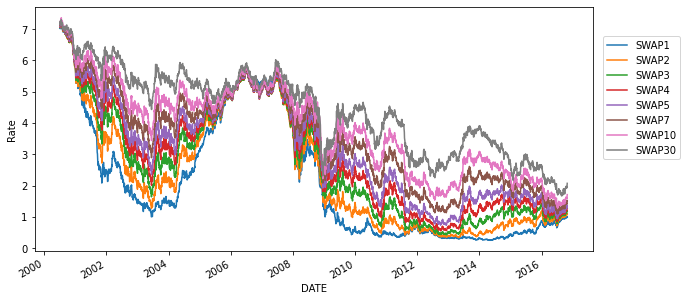

In [144]:
swap_df.plot(figsize=(10,5))
plt.ylabel("Rate")
plt.legend(bbox_to_anchor=(1.01, 0.9), loc=2)
plt.show()

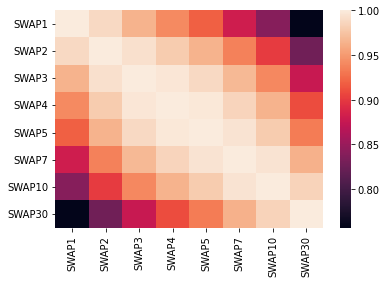

In [145]:
sns.heatmap(swap_df.corr())
plt.show()

In [146]:
swap_df2 = swap_df.copy()
swap_df2 = swap_df2.loc[:, ]

### Second - Treasury rates data

In [147]:
treasury = ['FRED/DGS1MO',
           'FRED/DGS3MO',
           'FRED/DGS6MO',
           'FRED/DGS1',
           'FRED/DGS2',
           'FRED/DGS3',
           'FRED/DGS5',
           'FRED/DGS7',
           'FRED/DGS10',
           'FRED/DGS20',
           'FRED/DGS30']

treasury_df = quandl.get(treasury)
treasury_df.columns = ['TRESY1mo',
                    'TRESY3mo', 
                    'TRESY6mo',
                    'TRESY1y',
                    'TRESY2y',
                    'TRESY3y',
                    'TRESY5y',
                    'TRESY7y',
                    'TRESY10y',
                    'TRESY20y',
                    'TRESY30y']

col = ['TRESY1y',
                    'TRESY2y',
                    'TRESY3y',
                    'TRESY5y',
                    'TRESY7y',
                    'TRESY10y']

In [148]:
treasury_df.head()

,TRESY1mo,TRESY3mo,TRESY6mo,TRESY1y,TRESY2y,TRESY3y,TRESY5y,TRESY7y,TRESY10y,TRESY20y,TRESY30y
Date,,,,,,,,,,,
1962-01-02,NaN,NaN,NaN,3.22,NaN,3.70,3.88,NaN,4.06,4.07,NaN
1962-01-03,NaN,NaN,NaN,3.24,NaN,3.70,3.87,NaN,4.03,4.07,NaN
1962-01-04,NaN,NaN,NaN,3.24,NaN,3.69,3.86,NaN,3.99,4.06,NaN
1962-01-05,NaN,NaN,NaN,3.26,NaN,3.71,3.89,NaN,4.02,4.07,NaN
1962-01-08,NaN,NaN,NaN,3.31,NaN,3.71,3.91,NaN,4.03,4.08,NaN


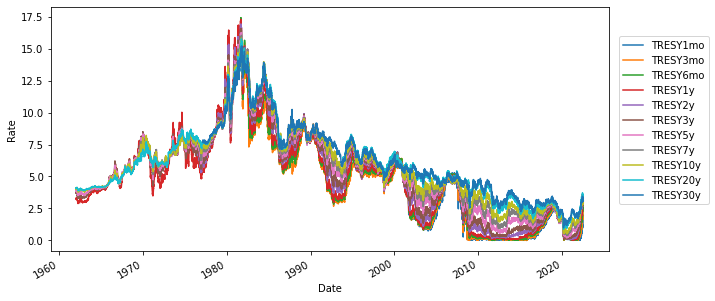

In [149]:
treasury_df.plot(figsize=(10,5))
plt.ylabel("Rate")
plt.legend(bbox_to_anchor=(1.01,.9), loc=2)
plt.show()

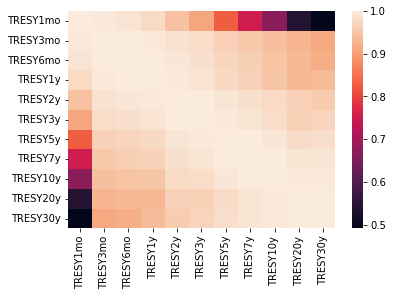

In [150]:
sns.heatmap(treasury_df.corr())
plt.show()

In [151]:
treasury_df

,TRESY1mo,TRESY3mo,TRESY6mo,TRESY1y,TRESY2y,TRESY3y,TRESY5y,TRESY7y,TRESY10y,TRESY20y,TRESY30y
Date,,,,,,,,,,,
1962-01-02,NaN,NaN,NaN,3.22,NaN,3.70,3.88,NaN,4.06,4.07,NaN
1962-01-03,NaN,NaN,NaN,3.24,NaN,3.70,3.87,NaN,4.03,4.07,NaN
1962-01-04,NaN,NaN,NaN,3.24,NaN,3.69,3.86,NaN,3.99,4.06,NaN
1962-01-05,NaN,NaN,NaN,3.26,NaN,3.71,3.89,NaN,4.02,4.07,NaN
1962-01-08,NaN,NaN,NaN,3.31,NaN,3.71,3.91,NaN,4.03,4.08,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2022-07-11,1.58,2.18,2.79,2.97,3.07,3.09,3.05,3.06,2.99,3.43,3.18
2022-07-12,1.63,2.22,2.78,3.07,3.03,3.07,3.01,3.01,2.96,3.37,3.13
2022-07-13,1.78,2.39,2.96,3.21,3.13,3.14,3.02,3.00,2.91,3.35,3.08


In [152]:
treasury_df2 = treasury_df.loc[:, col]
treasury_df2 = treasury_df2.dropna()
combined_df = treasury_df2.merge(swap_df2, left_index=True, right_index=True)
combined_df

,TRESY1y,TRESY2y,TRESY3y,TRESY5y,TRESY7y,TRESY10y,SWAP1,SWAP2,SWAP3,SWAP4,SWAP5,SWAP7,SWAP10,SWAP30
2000-07-03,6.07,6.31,6.24,6.12,6.19,6.00,7.10,7.16,7.17,7.17,7.17,7.20,7.24,7.24
2000-07-05,6.06,6.29,6.23,6.12,6.18,5.99,7.03,7.06,7.07,7.07,7.08,7.11,7.14,7.16
2000-07-06,6.10,6.34,6.28,6.16,6.24,6.05,7.07,7.13,7.14,7.15,7.16,7.19,7.21,7.21
2000-07-07,6.07,6.29,6.23,6.11,6.17,6.01,7.01,7.04,7.06,7.06,7.07,7.10,7.14,7.14
2000-07-10,6.09,6.31,6.24,6.13,6.21,6.04,7.04,7.09,7.11,7.13,7.14,7.17,7.20,7.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-10-24,0.66,0.84,1.00,1.27,1.56,1.77,0.99,1.08,1.15,1.22,1.30,1.43,1.61,1.96
2016-10-25,0.66,0.86,1.00,1.29,1.56,1.77,1.00,1.08,1.15,1.22,1.29,1.42,1.59,1.93
2016-10-26,0.67,0.86,1.01,1.30,1.59,1.79,1.01,1.10,1.18,1.25,1.33,1.47,1.64,1.98
2016-10-27,0.68,0.87,1.04,1.33,1.64,1.85,1.00,1.11,1.20,1.29,1.38,1.53,1.71,2.07


Also importing the U.S. Treasury Maturity Rate.

In [153]:
startDate = '2000-01-01'
endDate = '2023-01-01'
df = []
ids = ['DGS{}'.format(i) for i in ['1MO', '3MO', '6MO', 1,2,5,7,10,20,30]]
for s in ids:
    df.append(fred.get_series(s, observation_start=startDate, observation_end=endDate)/100)
  
df = pd.concat(df,axis=1)
df.columns = ids
maturity_df = df.dropna()

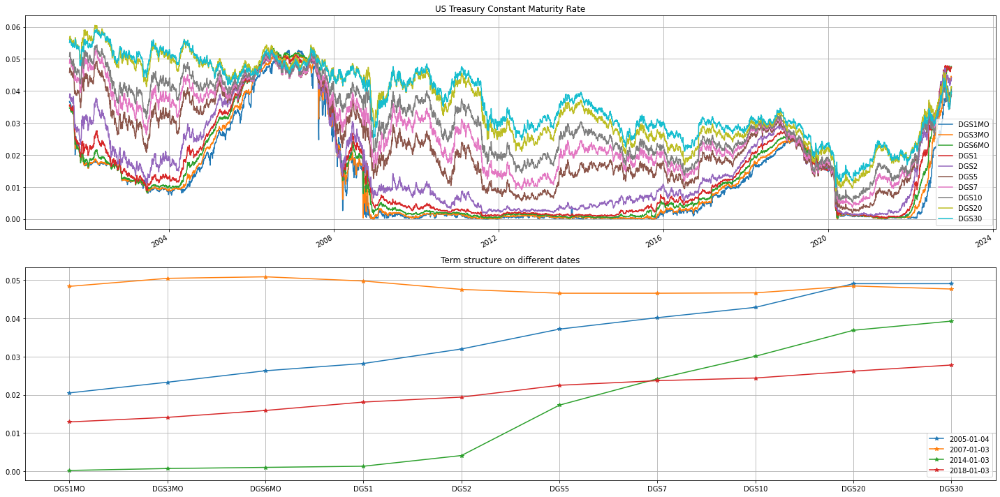

In [154]:
fig,(ax,ax2)=plt.subplots(nrows=2,ncols=1,figsize=(20,5*2))
maturity_df.plot(grid=True,title='US Treasury Constant Maturity Rate',ax=ax)
x = maturity_df.loc[[datetime(2005,1,4),datetime(2007,1,3),datetime(2014,1,3),datetime(2018,1,3)],:]
x.index = [t.date() for t in x.index]
ax.legend(loc='lower right')
ax2.plot(x.T.index,x.T,marker='*')
ax2.legend(x.index, loc='lower right')
ax2.grid(True)
ax2.set_title('Term structure on different dates')
fig.tight_layout()

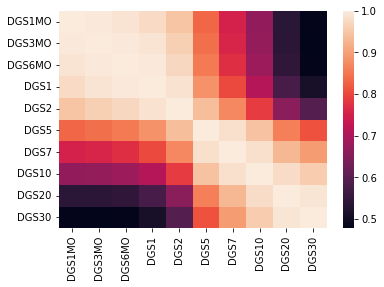

In [155]:
sns.heatmap(maturity_df.corr())
plt.show()

### Third - Spread rate data

In [156]:
spread = [combined_df.SWAP1-combined_df.TRESY1y, 
        combined_df.SWAP2-combined_df.TRESY2y,
       combined_df.SWAP3-combined_df.TRESY3y,
       combined_df.SWAP5-combined_df.TRESY5y,
       combined_df.SWAP7-combined_df.TRESY7y,
       combined_df.SWAP10-combined_df.TRESY10y]
spread_df = pd.DataFrame(np.array(spread).T, index=combined_df.index, 
                         columns = ["SPREAD1y", "SPREAD2y", "SPREAD3y", "SPREAD5y", "SPREAD7y", "SPREAD10y"])

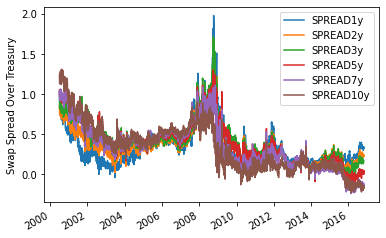

In [157]:
spread_df.plot()
plt.ylabel("Swap Spread Over Treasury")
plt.show()

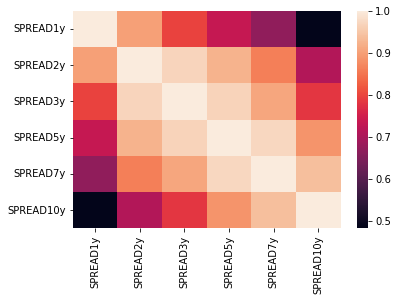

In [158]:
sns.heatmap(spread_df.corr())
plt.show()

## Step 4 - Cleaning Data

In [159]:
swap_df.isnull().sum()

SWAP1     0
SWAP2     0
SWAP3     0
SWAP4     0
SWAP5     0
SWAP7     0
SWAP10    0
SWAP30    0
dtype: int64

In [160]:
treasury_df2.isnull().sum()

TRESY1y     0
TRESY2y     0
TRESY3y     0
TRESY5y     0
TRESY7y     0
TRESY10y    0
dtype: int64

In [161]:
spread_df.isnull().sum()

SPREAD1y     0
SPREAD2y     0
SPREAD3y     0
SPREAD5y     0
SPREAD7y     0
SPREAD10y    0
dtype: int64

We can see that there are no outliers nor null values. So, the data is clean.

In [162]:
swap_df2.describe()

,SWAP1,SWAP2,SWAP3,SWAP4,SWAP5,SWAP7,SWAP10,SWAP30
count,4078.000000,4078.000000,4078.000000,4078.000000,4078.000000,4078.000000,4078.000000,4078.000000
mean,2.105755,2.390218,2.688190,2.953082,3.181395,3.534772,3.872545,4.394841
std,1.913386,1.832076,1.765902,1.699581,1.636723,1.534743,1.445819,1.331056
min,0.250000,0.340000,0.420000,0.560000,0.730000,1.100000,1.280000,1.670000
25%,0.490000,0.780000,1.060000,1.370000,1.660000,2.140000,2.552500,3.190000
50%,1.330000,1.800000,2.310000,2.770000,3.125000,3.610000,4.070000,4.620000
75%,3.507500,3.920000,4.197500,4.450000,4.580000,4.830000,5.020000,5.390000
max,7.130000,7.220000,7.250000,7.270000,7.290000,7.320000,7.360000,7.300000


In [163]:
treasury_df2.describe()

,TRESY1y,TRESY2y,TRESY3y,TRESY5y,TRESY7y,TRESY10y
count,11528.000000,11528.000000,11528.000000,11528.000000,11528.000000,11528.000000
mean,4.729735,5.023472,5.198956,5.515355,5.766339,5.948340
std,3.833076,3.803110,3.718687,3.570421,3.455406,3.335662
min,0.040000,0.090000,0.100000,0.190000,0.360000,0.520000
25%,1.240000,1.540000,1.690000,2.340000,2.780000,3.010000
50%,4.770000,4.860000,4.935000,5.220000,5.510000,5.610000
75%,6.980000,7.480000,7.660000,7.830000,7.990000,8.090000
max,17.310000,16.950000,16.590000,16.270000,16.050000,15.840000


In [164]:
spread_df.describe()

,SPREAD1y,SPREAD2y,SPREAD3y,SPREAD5y,SPREAD7y,SPREAD10y
count,4078.000000,4078.000000,4078.000000,4078.000000,4078.000000,4078.000000
mean,0.344640,0.366984,0.408210,0.395076,0.351932,0.337499
std,0.238055,0.228002,0.257108,0.267024,0.278854,0.301934
min,-0.040000,0.020000,-0.040000,-0.140000,-0.240000,-0.230000
25%,0.180000,0.200000,0.210000,0.170000,0.130000,0.100000
50%,0.260000,0.330000,0.390000,0.390000,0.350000,0.340000
75%,0.430000,0.440000,0.500000,0.520000,0.520000,0.540000
max,1.980000,1.690000,1.720000,1.300000,1.110000,1.310000


## Step 5 - Visualizing Data

### Box - Plot

<AxesSubplot:>

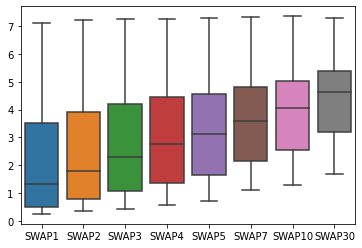

In [165]:
sns.boxplot(data=swap_df)

<AxesSubplot:>

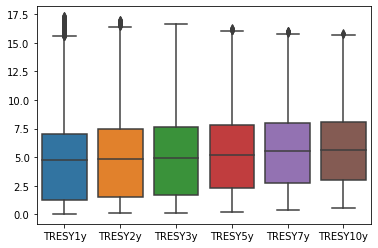

In [166]:
sns.boxplot(data=treasury_df2)

### Skewness - Kurtosis

,Median price,Mean price,Mean vs. Median price,Skewness,Kurtosis
SPREAD1y,0.26,0.34,0.08,1.98,5.44
SPREAD2y,0.33,0.37,0.04,1.46,2.83
SPREAD3y,0.39,0.41,0.02,1.09,1.62
SPREAD5y,0.39,0.40,0.01,0.56,-0.14
SPREAD7y,0.35,0.35,0.00,0.34,-0.42
SPREAD10y,0.34,0.34,-0.00,0.59,0.01


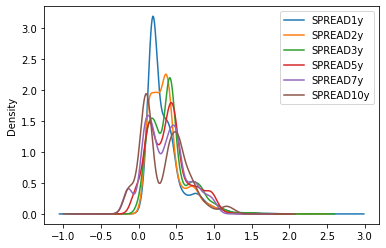

In [167]:
spread_df.plot(kind = 'density')
all = pd.DataFrame()
all['Median price'] = spread_df.median()
all['Mean price'] = spread_df.mean()
all['Mean vs. Median price'] = all['Mean price'] - all['Median price']
all['Skewness'] = spread_df.skew()
all['Kurtosis'] = spread_df.kurt()
all.round(2)

### Histogram Plot

/usr/local/lib/python3.9/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

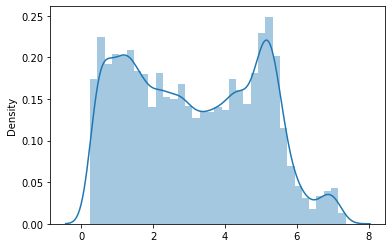

In [168]:
sns.distplot(swap_df)

/usr/local/lib/python3.9/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

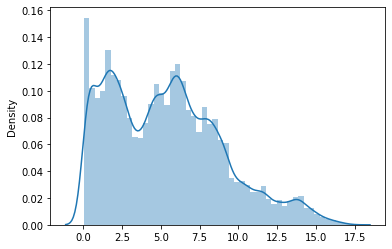

In [169]:
sns.distplot(treasury_df2)

/usr/local/lib/python3.9/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

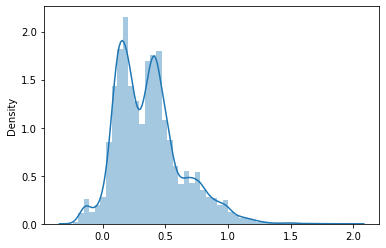

In [170]:
sns.distplot(spread_df)

## Step 6 - Stationarity Tests

#### On Swap Data

In [171]:
for i in range(len(swap_df.columns)):
  result_adf = adf(swap_df.iloc[:, [i]])
  print("ADF Result of",swap_df.columns[i],":")
  print('ADF Statistic:', result_adf[0])
  print('p-value:', result_adf[1])
  print('Critical Values:')
  for key, value in result_adf[4].items():
    print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

ADF Result of SWAP1 :
ADF Statistic: -2.5506390831803096
p-value: 0.10363422591686844
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SWAP2 :
ADF Statistic: -2.667295105214776
p-value: 0.079870627469744
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SWAP3 :
ADF Statistic: -2.472791152138088
p-value: 0.12223565327781993
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SWAP4 :
ADF Statistic: -2.346896661126757
p-value: 0.15728843816994081
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SWAP5 :
ADF Statistic: -2.2588791973805744
p-value: 0.1855732707057111
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SWAP7 :
ADF Statistic: -2.1274398926104086
p-value: 0.23362496640393038
Critical Values:
	1%: -3.432
	5%: -

In [172]:
for i in range(len(swap_df.columns)):
  result_kpss = kpss(swap_df.iloc[:, [i]])
  print("KPSS Result of",swap_df.columns[i],":")
  print('KPSS Statistic:', result_kpss[0])
  print('p-value:', result_kpss[1])
  print('Critical Values:')
  for key, value in result_kpss[3].items():
      print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

KPSS Result of SWAP1 :
KPSS Statistic: 5.1207659295990755
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SWAP2 :
KPSS Statistic: 6.2149764502444675
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SWAP3 :
KPSS Statistic: 6.976932851562482
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SWAP4 :
KPSS Statistic: 7.463710324376481
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SWAP5 :
KPSS Statistic: 7.8079326995799825
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SWAP7 :
KPSS Statistic: 8.233982825999687
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
--

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-va

In [173]:
for i in range(len(swap_df.columns)):
  ppt = pp(swap_df.iloc[:, [i]])
  print("PP Result of",swap_df.columns[i],":")
  print('PP Statistic:', ppt.stat)
  print('p-value:', ppt.pvalue)
  print("------------------------------------")

PP Result of SWAP1 :
PP Statistic: -2.7349917550306837
p-value: 0.06817641461814969
------------------------------------
PP Result of SWAP2 :
PP Statistic: -2.5907124578731304
p-value: 0.09493204699622082
------------------------------------
PP Result of SWAP3 :
PP Statistic: -2.409626584420197
p-value: 0.13903779034189978
------------------------------------
PP Result of SWAP4 :
PP Statistic: -2.2790106824103384
p-value: 0.17882682153316587
------------------------------------
PP Result of SWAP5 :
PP Statistic: -2.183821234854055
p-value: 0.21216972697102948
------------------------------------
PP Result of SWAP7 :
PP Statistic: -2.067736067084454
p-value: 0.2576843703590699
------------------------------------
PP Result of SWAP10 :
PP Statistic: -1.9509700654274504
p-value: 0.30847580030359273
------------------------------------
PP Result of SWAP30 :
PP Statistic: -1.6404874801037588
p-value: 0.46200608161449536
------------------------------------


#### On Treasury Data

In [174]:
for i in range(len(treasury_df2.columns)):
  result_adf = adf(treasury_df2.iloc[:, [i]])
  print("ADF Result of",treasury_df2.columns[i],":")
  print('ADF Statistic:', result_adf[0])
  print('p-value:', result_adf[1])
  print('Critical Values:')
  for key, value in result_adf[4].items():
    print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

ADF Result of TRESY1y :
ADF Statistic: -1.68018449046924
p-value: 0.44134985116641057
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of TRESY2y :
ADF Statistic: -1.5988479840265006
p-value: 0.4841721439377497
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of TRESY3y :
ADF Statistic: -1.5719090695637432
p-value: 0.49768731938253086
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of TRESY5y :
ADF Statistic: -1.5310891008180296
p-value: 0.5180798069986953
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of TRESY7y :
ADF Statistic: -1.4238708147667118
p-value: 0.5707801694212736
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of TRESY10y :
ADF Statistic: -1.3187297582912707
p-value: 0.6205604622159291
Critical Values:
	1%: 

In [175]:
for i in range(len(treasury_df2.columns)):
  result_kpss = kpss(treasury_df2.iloc[:, [i]])
  print("KPSS Result of",treasury_df2.columns[i],":")
  print('KPSS Statistic:', result_kpss[0])
  print('p-value:', result_kpss[1])
  print('Critical Values:')
  for key, value in result_kpss[3].items():
      print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

KPSS Result of TRESY1y :
KPSS Statistic: 14.116912255471291
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of TRESY2y :
KPSS Statistic: 14.736869757033938
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of TRESY3y :
KPSS Statistic: 15.040936367534833
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of TRESY5y :
KPSS Statistic: 15.437561542433425
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of TRESY7y :
KPSS Statistic: 15.643188329476517
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of TRESY10y :
KPSS Statistic: 15.785578591305947
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.5

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-va

In [176]:
for i in range(len(treasury_df2.columns)):
  ppt = pp(treasury_df2.iloc[:, [i]])
  print("PP Result of",treasury_df2.columns[i],":")
  print('PP Statistic:', ppt.stat)
  print('p-value:', ppt.pvalue)
  print("------------------------------------")

PP Result of TRESY1y :
PP Statistic: -1.6739466161415546
p-value: 0.44458347072392584
------------------------------------
PP Result of TRESY2y :
PP Statistic: -1.543388446454434
p-value: 0.5119490363860724
------------------------------------
PP Result of TRESY3y :
PP Statistic: -1.476513966891501
p-value: 0.5450959082065466
------------------------------------
PP Result of TRESY5y :
PP Statistic: -1.3940918597835914
p-value: 0.5851052547463091
------------------------------------
PP Result of TRESY7y :
PP Statistic: -1.3110363254964075
p-value: 0.6241081777055895
------------------------------------
PP Result of TRESY10y :
PP Statistic: -1.2266394741671975
p-value: 0.6620324045990149
------------------------------------


#### On Maturity Data

In [177]:
for i in range(len(maturity_df.columns)):
  result_adf = adf(maturity_df.iloc[:, [i]])
  print("ADF Result of",maturity_df.columns[i],":")
  print('ADF Statistic:', result_adf[0])
  print('p-value:', result_adf[1])
  print('Critical Values:')
  for key, value in result_adf[4].items():
    print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

ADF Result of DGS1MO :
ADF Statistic: -0.9063299700176519
p-value: 0.7858807207000105
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of DGS3MO :
ADF Statistic: -0.8534192739091889
p-value: 0.802925036656922
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of DGS6MO :
ADF Statistic: -0.734469076501541
p-value: 0.8376181423313236
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of DGS1 :
ADF Statistic: -0.929203045456595
p-value: 0.7782033987760437
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of DGS2 :
ADF Statistic: -1.1926484037307776
p-value: 0.6767501607401308
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of DGS5 :
ADF Statistic: -1.8628563098978796
p-value: 0.3497312477165752
Critical Values:
	1%: -3.432
	5%: -2.8

In [178]:
for i in range(len(maturity_df.columns)):
  result_kpss = kpss(maturity_df.iloc[:, [i]])
  print("KPSS Result of",maturity_df.columns[i],":")
  print('KPSS Statistic:', result_kpss[0])
  print('p-value:', result_kpss[1])
  print('Critical Values:')
  for key, value in result_kpss[3].items():
      print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

KPSS Result of DGS1MO :
KPSS Statistic: 2.5630456339224437
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of DGS3MO :
KPSS Statistic: 2.4542846807202463
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of DGS6MO :
KPSS Statistic: 2.440172544135374
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of DGS1 :
KPSS Statistic: 2.6493535288641303
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of DGS2 :
KPSS Statistic: 3.3823771759500123
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of DGS5 :
KPSS Statistic: 5.944184656989603
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
-

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-va

In [179]:
for i in range(len(maturity_df.columns)):
  ppt = pp(maturity_df.iloc[:, [i]])
  print("PP Result of",maturity_df.columns[i],":")
  print('PP Statistic:', ppt.stat)
  print('p-value:', ppt.pvalue)
  print("------------------------------------")

PP Result of DGS1MO :
PP Statistic: -1.281919047944903
p-value: 0.6374032433942747
------------------------------------
PP Result of DGS3MO :
PP Statistic: -0.9061598378457227
p-value: 0.7859371266662949
------------------------------------
PP Result of DGS6MO :
PP Statistic: -0.6253155146769268
p-value: 0.8651585474249626
------------------------------------
PP Result of DGS1 :
PP Statistic: -0.6858958128461996
p-value: 0.8503690940298909
------------------------------------
PP Result of DGS2 :
PP Statistic: -1.1521052074268265
p-value: 0.6938523492559363
------------------------------------
PP Result of DGS5 :
PP Statistic: -1.9265600902389726
p-value: 0.3196713941158612
------------------------------------
PP Result of DGS7 :
PP Statistic: -2.100378206890869
p-value: 0.24436254980739397
------------------------------------
PP Result of DGS10 :
PP Statistic: -2.1524027123256695
p-value: 0.22397152482371224
------------------------------------
PP Result of DGS20 :
PP Statistic: -2.019

#### On Spread Data

In [180]:
for i in range(len(spread_df.columns)):
  result_adf = adf(spread_df.iloc[:, [i]])
  print("ADF Result of",spread_df.columns[i],":")
  print('ADF Statistic:', result_adf[0])
  print('p-value:', result_adf[1])
  print('Critical Values:')
  for key, value in result_adf[4].items():
    print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

ADF Result of SPREAD1y :
ADF Statistic: -2.9707636793555525
p-value: 0.0377163850010292
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SPREAD2y :
ADF Statistic: -2.6890001745767647
p-value: 0.0759611377920618
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SPREAD3y :
ADF Statistic: -2.4572488354469924
p-value: 0.12622556747463326
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SPREAD5y :
ADF Statistic: -2.183002700589333
p-value: 0.21247222939870714
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SPREAD7y :
ADF Statistic: -1.9559151188979993
p-value: 0.3062307965700831
Critical Values:
	1%: -3.432
	5%: -2.862
	10%: -2.567
------------------------------------
ADF Result of SPREAD10y :
ADF Statistic: -2.4409199754147726
p-value: 0.13051845333369727
Critical Value

In [181]:
for i in range(len(spread_df.columns)):
  result_kpss = kpss(spread_df.iloc[:, [i]])
  print("KPSS Result of",spread_df.columns[i],":")
  print('KPSS Statistic:', result_kpss[0])
  print('p-value:', result_kpss[1])
  print('Critical Values:')
  for key, value in result_kpss[3].items():
      print('\t%s: %.3f' % (key, value))
  print("------------------------------------")

KPSS Result of SPREAD1y :
KPSS Statistic: 1.0975395047890955
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SPREAD2y :
KPSS Statistic: 2.979551344123622
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SPREAD3y :
KPSS Statistic: 4.379706417525027
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SPREAD5y :
KPSS Statistic: 5.737629543627769
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SPREAD7y :
KPSS Statistic: 6.294869469822599
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
------------------------------------
KPSS Result of SPREAD10y :
KPSS Statistic: 7.386750458440637
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(
/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-va

In [182]:
for i in range(len(spread_df.columns)):
  ppt = pp(spread_df.iloc[:, [i]])
  print("PP Result of",spread_df.columns[i],":")
  print('PP Statistic:', ppt.stat)
  print('p-value:', ppt.pvalue)
  print("------------------------------------")

PP Result of SPREAD1y :
PP Statistic: -4.47954188499329
p-value: 0.00021407235267910374
------------------------------------
PP Result of SPREAD2y :
PP Statistic: -5.040709663541269
p-value: 1.842405288254238e-05
------------------------------------
PP Result of SPREAD3y :
PP Statistic: -4.664926654833204
p-value: 9.789018959555287e-05
------------------------------------
PP Result of SPREAD5y :
PP Statistic: -4.715520167765495
p-value: 7.868129844236892e-05
------------------------------------
PP Result of SPREAD7y :
PP Statistic: -4.2228801553990785
p-value: 0.0006025407852610575
------------------------------------
PP Result of SPREAD10y :
PP Statistic: -3.841410638420049
p-value: 0.0025109395585149762
------------------------------------


## Step 7 - Applying PCA to data

### PCA to Swap dataset

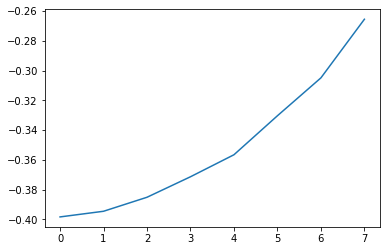

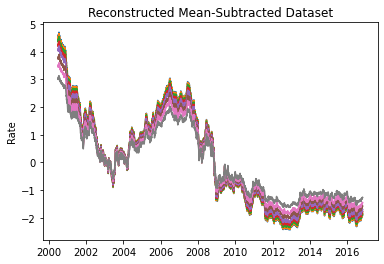

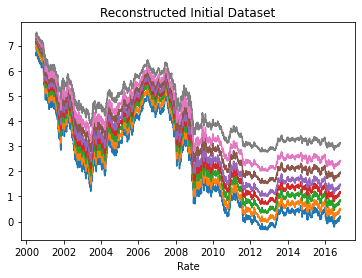

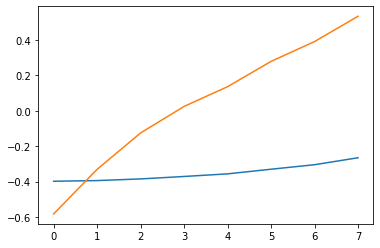

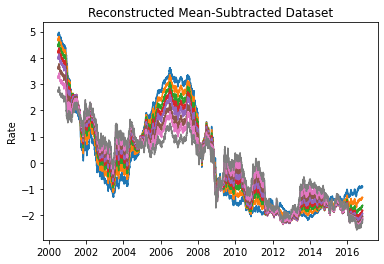

...

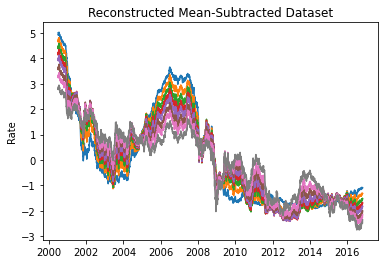

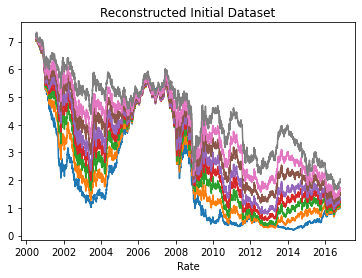

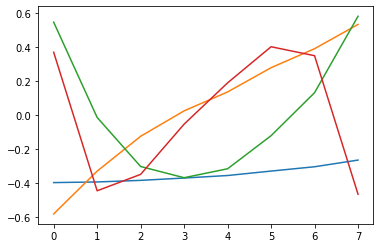

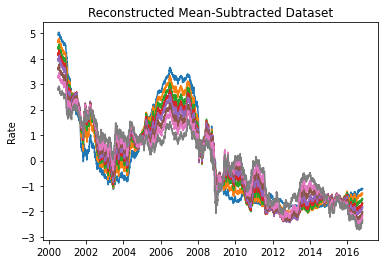

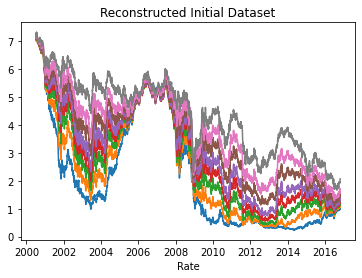

In [183]:
vec = [1,2,3,4]

for i in vec:
  scores, evals, evecs = mPCA(swap_df, i)
  evecs = pd.DataFrame(evecs)
  plt.plot(evecs)
  plt.show()
  reconst = pd.DataFrame(np.dot(scores,evecs.T), index=swap_df.index, columns=swap_df.columns)
  plt.plot(reconst)
  plt.ylabel("Rate")
  plt.title("Reconstructed Mean-Subtracted Dataset")
  plt.show()
  for cols in reconst.columns:
    reconst[cols] = reconst[cols] + swap_df2.mean(axis=0)[cols]
  plt.plot(reconst)
  plt.xlabel("Rate")
  plt.title("Reconstructed Initial Dataset")
  plt.show()

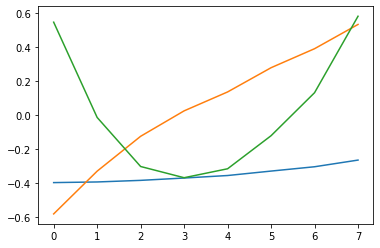

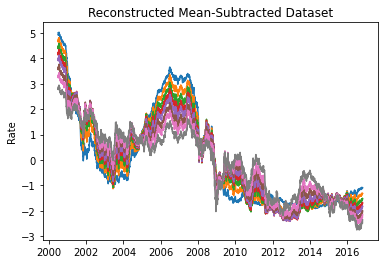

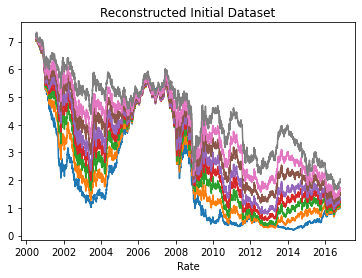

In [184]:
vec = 3
scores, evals, evecs = mPCA(swap_df, vec)
evecs = pd.DataFrame(evecs)
plt.plot(evecs)
plt.show()
reconst = pd.DataFrame(np.dot(scores,evecs.T), index=swap_df.index, columns=swap_df.columns)
plt.plot(reconst)
plt.ylabel("Rate")
plt.title("Reconstructed Mean-Subtracted Dataset")
plt.show()
for cols in reconst.columns:
  reconst[cols] = reconst[cols] + swap_df2.mean(axis=0)[cols]
plt.plot(reconst)
plt.xlabel("Rate")
plt.title("Reconstructed Initial Dataset")
def PCA(df, num_reconstruct):
    
    df -= df.mean(axis=0)
    R = np.cov(df, rowvar=False)
    eigenvals, eigenvecs = sp.linalg.eigh(R)
    eigenvecs = eigenvecs[:, np.argsort(eigenvals)[::-1]]
    eigenvals = eigenvals[np.argsort(eigenvals)[::-1]]
    eigenvecs = eigenvecs[:, :num_reconstruct]

    return np.dot(eigenvecs.T, df.T).T, eigenvals, eigenvecsplt.show()

### PCA to Treasury dataset

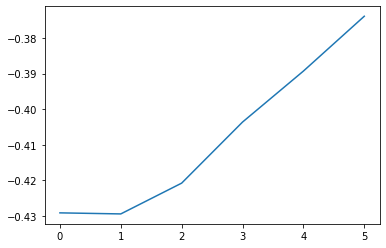

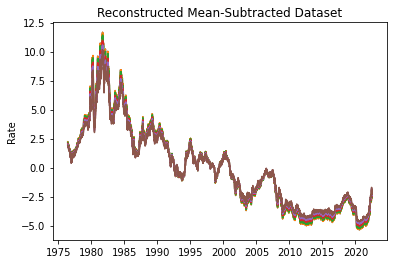

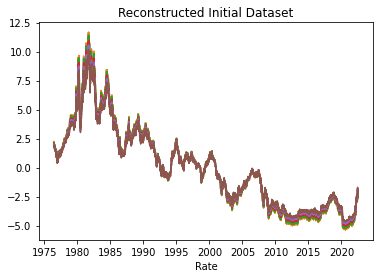

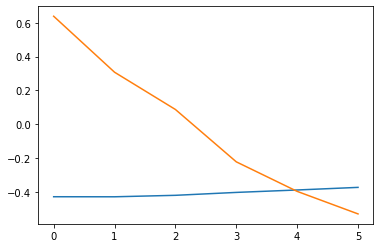

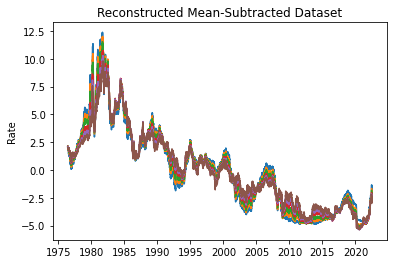

...

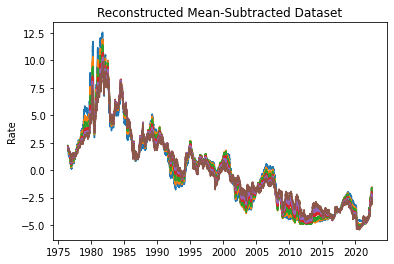

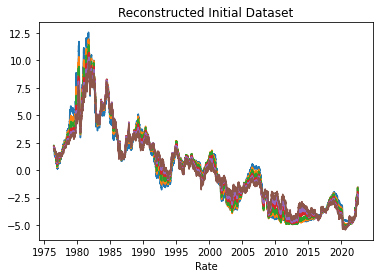

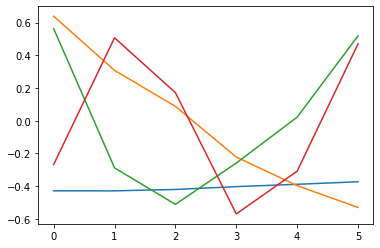

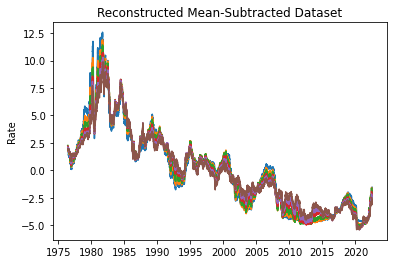

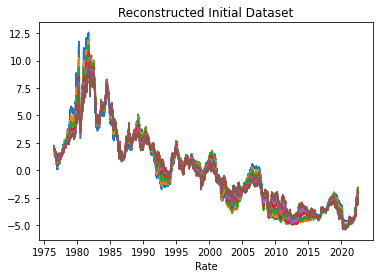

In [185]:
vec = [1,2,3,4]
comb_df = treasury_df2.merge(swap_df2, left_index=True, right_index=True)

for i in vec:
  scores, evals, evecs = mPCA(treasury_df2, i)
  evecs = pd.DataFrame(evecs)
  plt.plot(evecs)
  plt.show()
  reconst = pd.DataFrame(np.dot(scores,evecs.T), index=treasury_df2.index, columns=treasury_df2.columns)
  plt.plot(reconst)
  plt.ylabel("Rate")
  plt.title("Reconstructed Mean-Subtracted Dataset")
  plt.show()
  for cols in reconst.columns:
    reconst[cols] = reconst[cols] + treasury_df2.mean(axis=0)[cols]
  plt.plot(reconst)
  plt.xlabel("Rate")
  plt.title("Reconstructed Initial Dataset")
  plt.show()

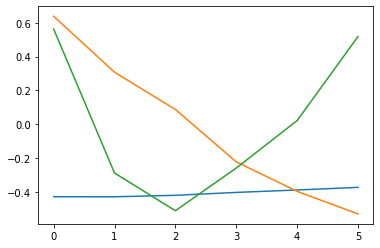

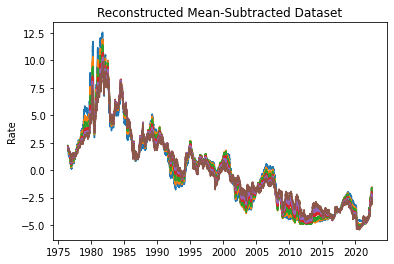

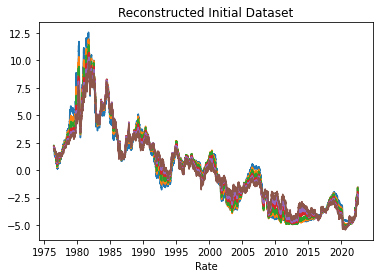

In [186]:
vec = 3
scores, evals, evecs = mPCA(treasury_df2, vec)
evecs = pd.DataFrame(evecs)
plt.plot(evecs)
plt.show()
reconst = pd.DataFrame(np.dot(scores,evecs.T), index=treasury_df2.index, columns=treasury_df2.columns)
plt.plot(reconst)
plt.ylabel("Rate")
plt.title("Reconstructed Mean-Subtracted Dataset")
plt.show()
for cols in reconst.columns:
  reconst[cols] = reconst[cols] + treasury_df2.mean(axis=0)[cols]
plt.plot(reconst)
plt.xlabel("Rate")
plt.title("Reconstructed Initial Dataset")
def PCA(df, num_reconstruct):
    
    df -= df.mean(axis=0)
    R = np.cov(df, rowvar=False)
    eigenvals, eigenvecs = sp.linalg.eigh(R)
    eigenvecs = eigenvecs[:, np.argsort(eigenvals)[::-1]]
    eigenvals = eigenvals[np.argsort(eigenvals)[::-1]]
    eigenvecs = eigenvecs[:, :num_reconstruct]

    return np.dot(eigenvecs.T, df.T).T, eigenvals, eigenvecsplt.show()

### PCA to Maturity dataset

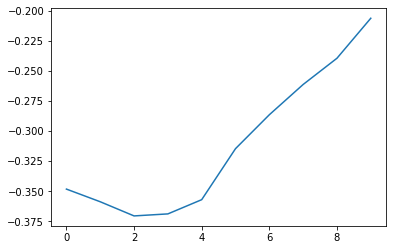

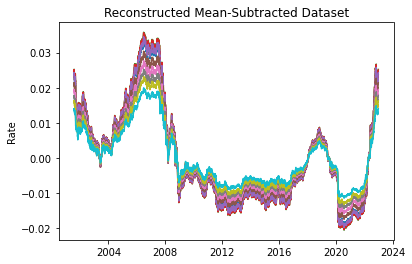

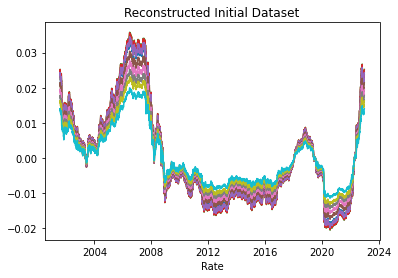

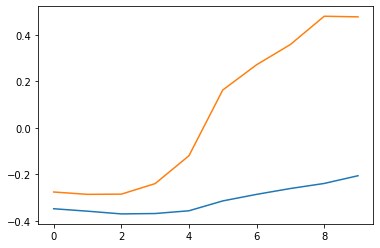

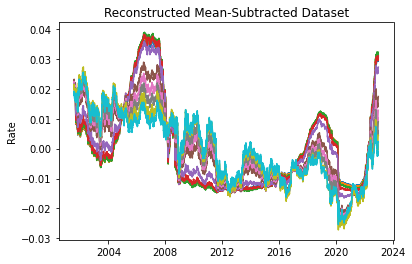

...

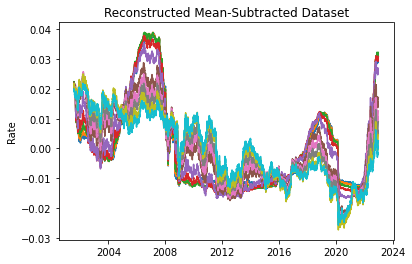

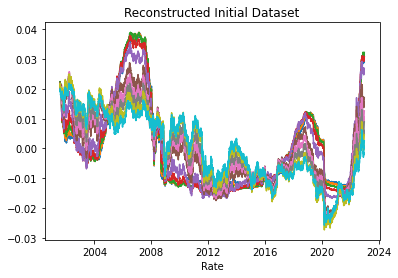

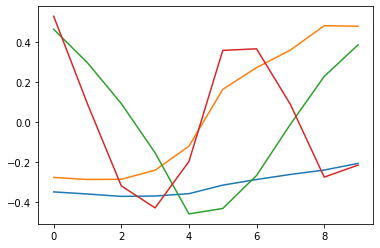

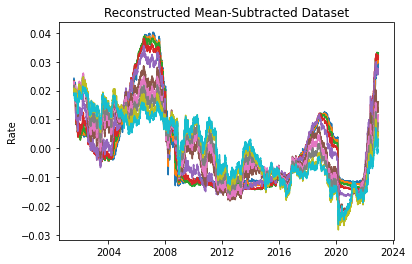

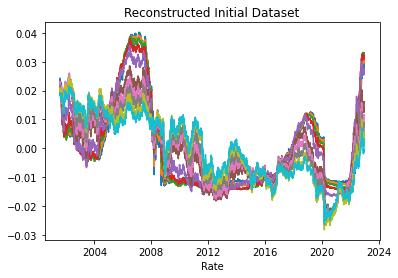

In [187]:
vec = [1,2,3,4]

for i in vec:
  scores, evals, evecs = mPCA(maturity_df, i)
  evecs = pd.DataFrame(evecs)
  plt.plot(evecs)
  plt.show()
  reconst = pd.DataFrame(np.dot(scores,evecs.T), index=maturity_df.index, columns=maturity_df.columns)
  plt.plot(reconst)
  plt.ylabel("Rate")
  plt.title("Reconstructed Mean-Subtracted Dataset")
  plt.show()
  for cols in reconst.columns:
    reconst[cols] = reconst[cols] + maturity_df.mean(axis=0)[cols]
  plt.plot(reconst)
  plt.xlabel("Rate")
  plt.title("Reconstructed Initial Dataset")
  plt.show()

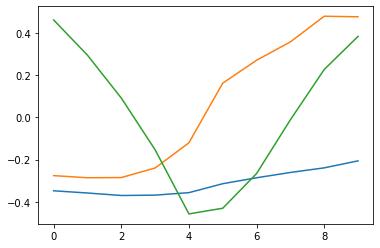

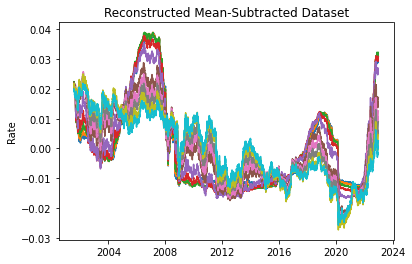

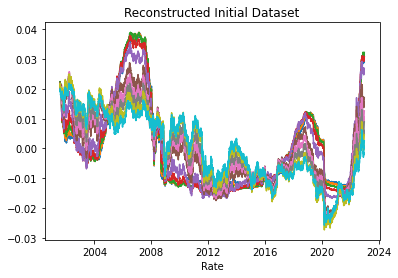

In [188]:
vec = 3
scores, evals, evecs = mPCA(maturity_df, vec)
evecs = pd.DataFrame(evecs)
plt.plot(evecs)
plt.show()
reconst = pd.DataFrame(np.dot(scores,evecs.T), index=maturity_df.index, columns=maturity_df.columns)
plt.plot(reconst)
plt.ylabel("Rate")
plt.title("Reconstructed Mean-Subtracted Dataset")
plt.show()
for cols in reconst.columns:
  reconst[cols] = reconst[cols] + maturity_df.mean(axis=0)[cols]
plt.plot(reconst)
plt.xlabel("Rate")
plt.title("Reconstructed Initial Dataset")
def PCA(df, num_reconstruct):
    
    df -= df.mean(axis=0)
    R = np.cov(df, rowvar=False)
    eigenvals, eigenvecs = sp.linalg.eigh(R)
    eigenvecs = eigenvecs[:, np.argsort(eigenvals)[::-1]]
    eigenvals = eigenvals[np.argsort(eigenvals)[::-1]]
    eigenvecs = eigenvecs[:, :num_reconstruct]

    return np.dot(eigenvecs.T, df.T).T, eigenvals, eigenvecsplt.show()

### PCA to Spread dataset


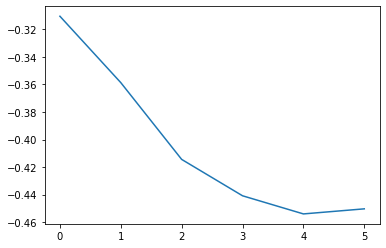

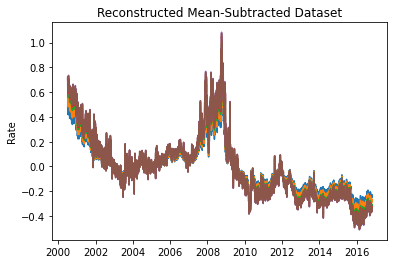

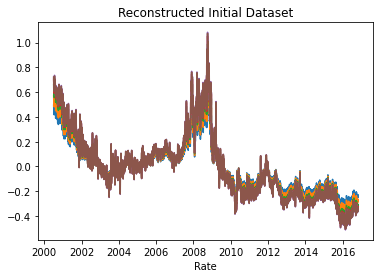

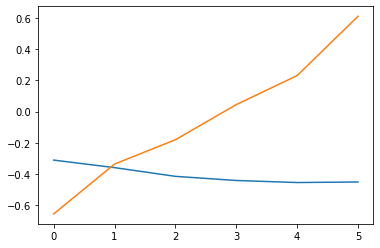

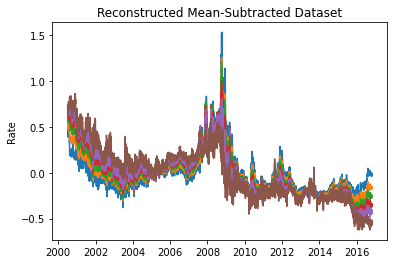

...

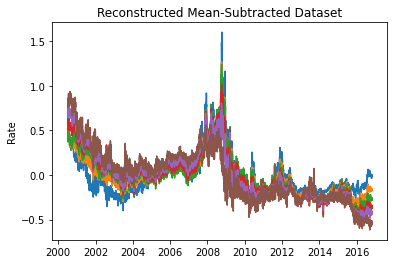

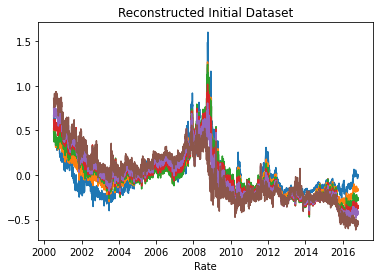

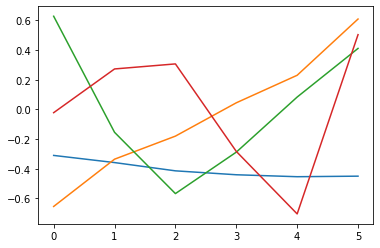

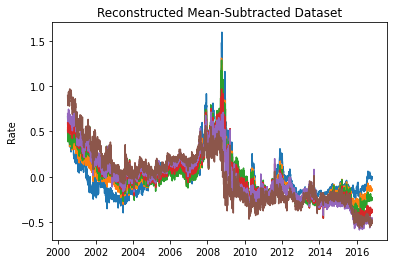

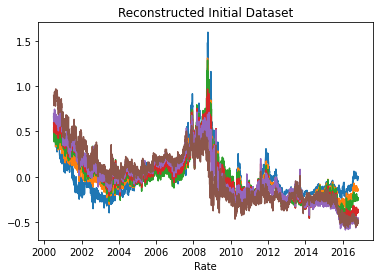

In [189]:
vec = [1,2,3,4]

for i in vec:
  scores, evals, evecs = mPCA(spread_df, i)
  evecs = pd.DataFrame(evecs)
  plt.plot(evecs)
  plt.show()
  reconst = pd.DataFrame(np.dot(scores,evecs.T), index=spread_df.index, columns=spread_df.columns)
  plt.plot(reconst)
  plt.ylabel("Rate")
  plt.title("Reconstructed Mean-Subtracted Dataset")
  plt.show()
  for cols in reconst.columns:
    reconst[cols] = reconst[cols] + spread_df.mean(axis=0)[cols]
  plt.plot(reconst)
  plt.xlabel("Rate")
  plt.title("Reconstructed Initial Dataset")
  plt.show()


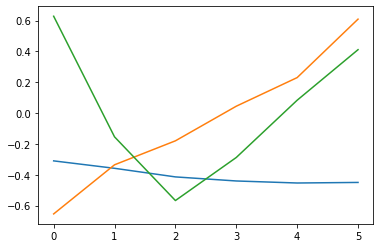

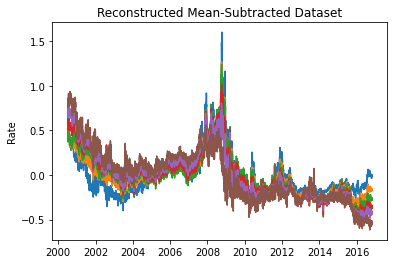

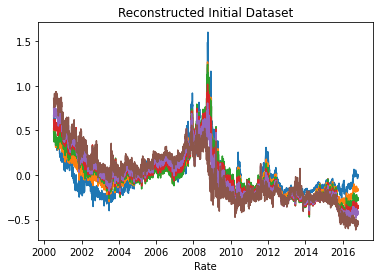

In [190]:
vec = 3
scores, evals, evecs = mPCA(spread_df, vec)
evecs = pd.DataFrame(evecs)
plt.plot(evecs)
plt.show()
reconst = pd.DataFrame(np.dot(scores,evecs.T), index=spread_df.index, columns=spread_df.columns)
plt.plot(reconst)
plt.ylabel("Rate")
plt.title("Reconstructed Mean-Subtracted Dataset")
plt.show()
for cols in reconst.columns:
  reconst[cols] = reconst[cols] + spread_df.mean(axis=0)[cols]
plt.plot(reconst)
plt.xlabel("Rate")
plt.title("Reconstructed Initial Dataset")
def PCA(df, num_reconstruct):
    
    df -= df.mean(axis=0)
    R = np.cov(df, rowvar=False)
    eigenvals, eigenvecs = sp.linalg.eigh(R)
    eigenvecs = eigenvecs[:, np.argsort(eigenvals)[::-1]]
    eigenvals = eigenvals[np.argsort(eigenvals)[::-1]]
    eigenvecs = eigenvecs[:, :num_reconstruct]

    return np.dot(eigenvecs.T, df.T).T, eigenvals, eigenvecsplt.show()

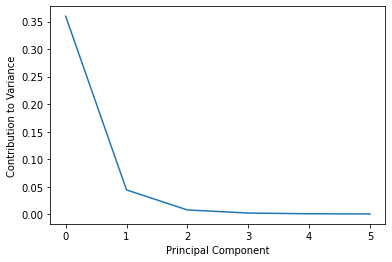

In [191]:
plt.plot(evals)
plt.ylabel("Contribution to Variance")
plt.xlabel("Principal Component")
plt.show()

## Step 8 - Reconstruction

### Defining PCABase

In [192]:
from sklearn.decomposition import PCA
class PCABase(object):
    def __init__(self, X, adjust_sign=True):
        self.X = X
        self.n_features = X.shape[1]
        self.dates = X.index
        self.Xc = self.X - self.X.mean()  # centered
        self.pc_names = lambda n: ['PC' + str(i) for i in np.arange(1, n + 1)]
        self.adjust_sign = adjust_sign


    def pca(self, n_pc=None):
        '''
        fit pca model
        n_pc: number of pcs to fit, take total feature numbers if not specified
        '''
        if n_pc:
            model = PCA(n_components=n_pc).fit(self.Xc)
        else:
            model = PCA().fit(self.Xc)
        return model

    def cps(self):
        '''
        loading matrix => principal axes in feature space
        '''
        cps = self.pca().components_.T
        cps = self.to_df_pc(cps, is_loading=True)
        if self.adjust_sign:
            cps.loc[:, 'PC1'] = np.sign(cps.loc[:, 'PC1'].values[0]) * cps.loc[:, 'PC1']
            cps.loc[:, 'PC2'] = -np.sign(cps.loc[:, 'PC2'].values[0]) * cps.loc[:, 'PC2']
        return cps

    def cumsum_expvar_ratio(self):
        var_exp = self.pca().explained_variance_ratio_
        var_exp_cumsum = np.cumsum(var_exp)
        return var_exp, var_exp_cumsum

    def scores(self):
        '''
        PC scores:
        '''
        scores = self.pca().transform(self.Xc)
        scores = self.to_df_pc(scores)
        if self.adjust_sign:
            cps = self.cps()
            scores.loc[:, 'PC1'] = np.sign(cps.loc[:, 'PC1'].values[0]) * scores.loc[:, 'PC1']
            scores.loc[:, 'PC2'] = -np.sign(cps.loc[:, 'PC2'].values[0]) * scores.loc[:, 'PC2']
        return scores

    def scores2(self):
        '''
        equivalent to the sklearn transform function
        '''
        scores = self.Xc.dot(self.cps())
        scores = self.to_df_pc(scores)
        if self.adjust_sign:
            cps = self.cps()
            scores.loc[:, 'PC1'] = np.sign(cps.loc[:, 'PC1'].values[0]) * scores.loc[:, 'PC1']
            scores.loc[:, 'PC2'] = -np.sign(cps.loc[:, 'PC2'].values[0]) * scores.loc[:, 'PC2']
        return scores

    def x_projected(self, p, centered=False):
        xp = self.scores().iloc[:, 0:p].dot(self.cps().T.iloc[0:p, :])
        if not centered:
            xp = xp + self.X.mean()
        return xp

    def residuals(self, p):
        residuals = self.X - self.x_projected(p, centered=False)
        return residuals

    def covX(self):
        return self.X.cov()

    def eigenv(self):
        eig_vals, eig_vecs = np.linalg.eig(self.covX())
        return eig_vals, eig_vecs

    def to_df_pc(self, data, is_loading=False):
        cols = self.pc_names(self.n_features)
        idx = self.X.columns if is_loading else self.dates
        return pd.DataFrame(data, columns=cols, index=idx)

### Reconstructing Swap Dataset

In [193]:
pcab_w = PCABase(swap_df)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
SWAP1,0.398272,-0.582862,-0.547360,0.370237,-0.243813,-0.068998,-0.019578,0.019591
SWAP2,0.394477,-0.330765,0.014223,-0.446503,0.597824,0.365376,0.140462,-0.157458
SWAP3,0.385068,-0.125279,0.303352,-0.349773,-0.074967,-0.496320,-0.357805,0.491616
SWAP4,0.371299,0.024636,0.369450,-0.053749,-0.371393,-0.218919,0.154742,-0.715783
SWAP5,0.356508,0.136138,0.316726,0.189746,-0.297502,0.462132,0.460620,0.451448
SWAP7,0.330307,0.279021,0.121841,0.402599,0.162362,0.332227,-0.695932,-0.122704
SWAP10,0.304863,0.391045,-0.131666,0.349759,0.500787,-0.481943,0.359985,0.042762
SWAP30,0.265490,0.534100,-0.582394,-0.466807,-0.271942,0.106162,-0.042853,-0.010081


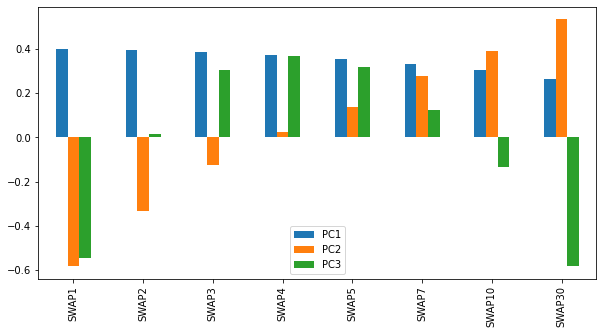

In [194]:
V = pd.DataFrame(pcab_w.pca().components_,index=pcab_w.pc_names(pcab_w.n_features),columns=pcab_w.X.columns)
V.T.iloc[:,0:3].plot(figsize=(10,5),kind='bar')
pcab_w.cps()

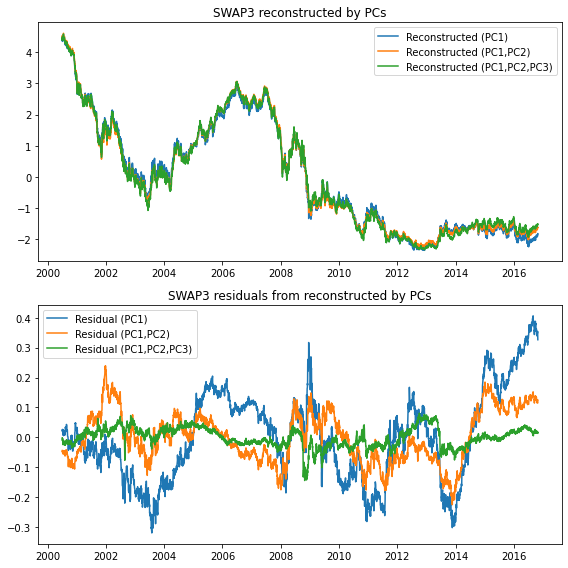

In [195]:
r = 'SWAP3'
fig,(ax,ax2)=plt.subplots(figsize=(8,4*2),ncols=1,nrows=2)
ax.plot(pcab_w.x_projected(1)[r])
ax.plot(pcab_w.x_projected(2)[r])
ax.plot(pcab_w.x_projected(3)[r])
ax.legend(['Reconstructed (PC1)','Reconstructed (PC1,PC2)','Reconstructed (PC1,PC2,PC3)'])
ax.set_title('{} reconstructed by PCs'.format(r))

ax2.plot(pcab_w.residuals(1)[r])
ax2.plot(pcab_w.residuals(2)[r])
ax2.plot(pcab_w.residuals(3)[r])
ax2.legend(['Residual (PC1)','Residual (PC1,PC2)','Residual (PC1,PC2,PC3)'])
ax2.set_title('{} residuals from reconstructed by PCs'.format(r))
fig.tight_layout()

Text(0.5, 1.0, 'Evolution of PCA Factors 1,2,3')

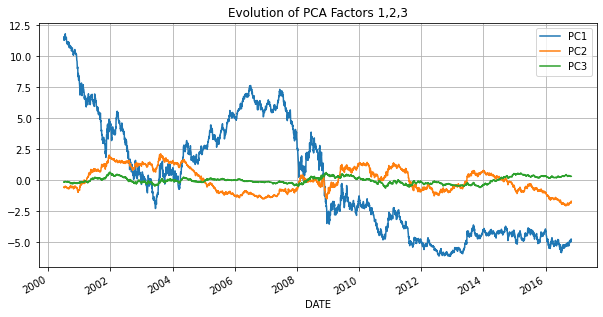

In [196]:
# PC
fig,ax=plt.subplots(figsize=(10,5))
l1=pcab_w.scores().iloc[:,0:3].plot(ax=ax)
ax.grid(True)
ax.set_title('Evolution of PCA Factors 1,2,3')

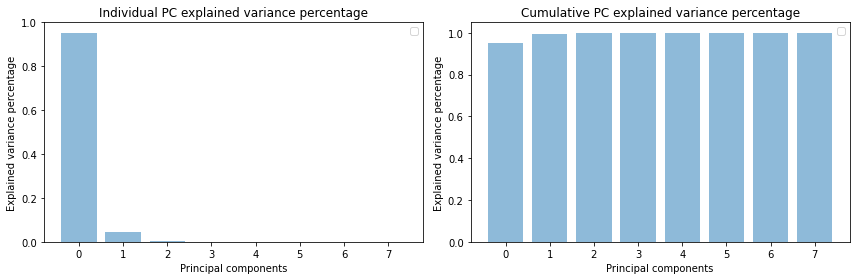

In [197]:
fig,(ax,ax2) = plt.subplots(figsize=(6*2, 4),ncols=2,nrows=1)
ax.bar(range(pcab_w.n_features), pcab_w.cumsum_expvar_ratio()[0], alpha=0.5, align='center')
ax2.bar(range(pcab_w.n_features), pcab_w.cumsum_expvar_ratio()[1], alpha=0.5, align='center')
ax.set_ylabel('Explained variance percentage')
ax.set_xlabel('Principal components')
ax.set_title('Individual PC explained variance percentage')
ax.legend(loc='best')
ax2.set_ylabel('Explained variance percentage')
ax2.set_xlabel('Principal components')
ax2.set_title('Cumulative PC explained variance percentage')
ax2.legend(loc='best')
fig.tight_layout()

### Reconstructing Treasury Dataset

In [198]:
pcab_t = PCABase(treasury_df2)

,PC1,PC2,PC3,PC4,PC5,PC6
TRESY1y,0.429207,-0.638965,0.563300,0.267999,0.068844,-0.116770
TRESY2y,0.429504,-0.307691,-0.288941,-0.506842,-0.400355,0.469247
TRESY3y,0.420833,-0.087177,-0.511943,-0.171548,0.392246,-0.608218
TRESY5y,0.403634,0.222686,-0.259308,0.570569,0.343354,0.526127
TRESY7y,0.389276,0.397501,0.021572,0.308911,-0.692357,-0.339424
TRESY10y,0.373834,0.530899,0.519052,-0.469983,0.289603,0.065002


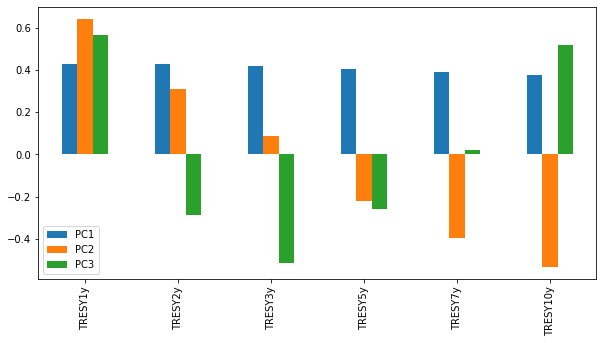

In [199]:
V = pd.DataFrame(pcab_t.pca().components_,index=pcab_t.pc_names(pcab_t.n_features),columns=pcab_t.X.columns)
V.T.iloc[:,0:3].plot(figsize=(10,5),kind='bar')
pcab_t.cps()

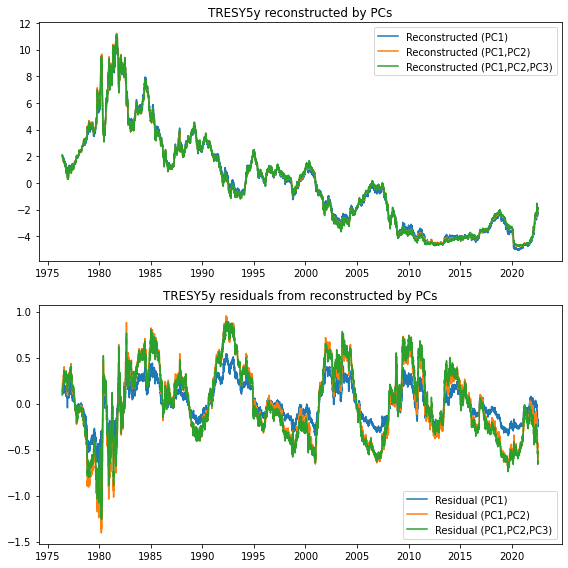

In [200]:
r = 'TRESY5y'
fig,(ax,ax2)=plt.subplots(figsize=(8,4*2),ncols=1,nrows=2)
ax.plot(pcab_t.x_projected(1)[r])
ax.plot(pcab_t.x_projected(2)[r])
ax.plot(pcab_t.x_projected(3)[r])
ax.legend(['Reconstructed (PC1)','Reconstructed (PC1,PC2)','Reconstructed (PC1,PC2,PC3)'])
ax.set_title('{} reconstructed by PCs'.format(r))

ax2.plot(pcab_t.residuals(1)[r])
ax2.plot(pcab_t.residuals(2)[r])
ax2.plot(pcab_t.residuals(3)[r])
ax2.legend(['Residual (PC1)','Residual (PC1,PC2)','Residual (PC1,PC2,PC3)'])
ax2.set_title('{} residuals from reconstructed by PCs'.format(r))
fig.tight_layout()

Text(0.5, 1.0, 'Evolution of PCA Factors 1,2,3')

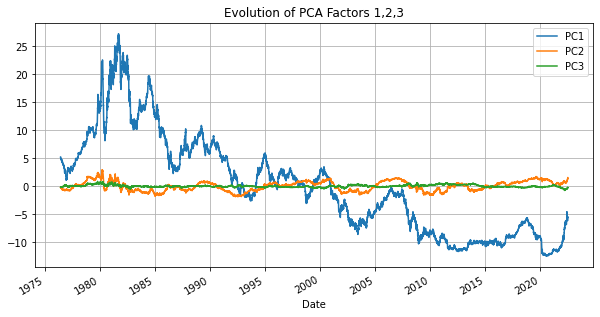

In [201]:
# PC
fig,ax=plt.subplots(figsize=(10,5))
l1=pcab_t.scores().iloc[:,0:3].plot(ax=ax)
ax.grid(True)
ax.set_title('Evolution of PCA Factors 1,2,3')

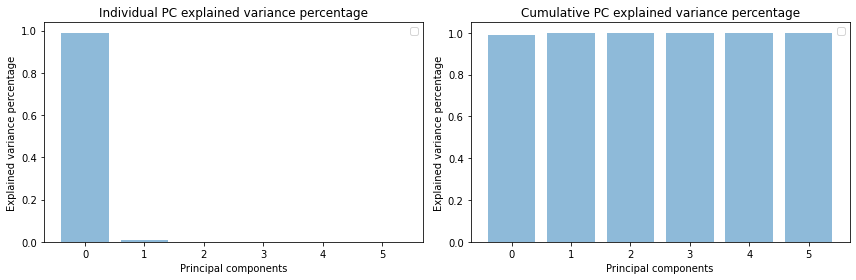

In [202]:
fig,(ax,ax2) = plt.subplots(figsize=(6*2, 4),ncols=2,nrows=1)
ax.bar(range(pcab_t.n_features), pcab_t.cumsum_expvar_ratio()[0], alpha=0.5, align='center')
ax2.bar(range(pcab_t.n_features), pcab_t.cumsum_expvar_ratio()[1], alpha=0.5, align='center')
ax.set_ylabel('Explained variance percentage')
ax.set_xlabel('Principal components')
ax.set_title('Individual PC explained variance percentage')
ax.legend(loc='best')
ax2.set_ylabel('Explained variance percentage')
ax2.set_xlabel('Principal components')
ax2.set_title('Cumulative PC explained variance percentage')
ax2.legend(loc='best')
fig.tight_layout()

### Reconstructing Maturity Dataset

In [203]:
pcab_m = PCABase(maturity_df)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
DGS1MO,0.348263,-0.276252,-0.462781,-0.527567,-0.245677,0.285357,0.320182,0.241433,0.033638,0.078620
DGS3MO,0.358793,-0.286351,-0.295390,-0.090388,0.132740,-0.131109,-0.488484,-0.555608,-0.196110,-0.270665
DGS6MO,0.370574,-0.285464,-0.091990,0.318492,0.376007,-0.249524,-0.047514,0.189006,0.490260,0.435094
DGS1,0.368897,-0.240142,0.153742,0.427969,0.031749,-0.036064,0.231125,0.387814,-0.487415,-0.394654
DGS2,0.357064,-0.120232,0.458061,0.196579,-0.539500,0.257643,0.082092,-0.407112,0.091049,0.267163
DGS5,0.314622,0.162904,0.431002,-0.357320,-0.014589,-0.036525,-0.286383,0.274821,0.436769,-0.459542
DGS7,0.286417,0.271522,0.266321,-0.365133,0.187745,-0.172807,-0.160163,0.123595,-0.521023,0.512337
DGS10,0.261235,0.358744,0.011079,-0.087858,0.330211,-0.183320,0.660645,-0.418276,0.103940,-0.174244
DGS20,0.239413,0.480436,-0.227619,0.274527,0.230731,0.697569,-0.206045,0.047092,0.009071,0.009699
DGS30,0.206134,0.477804,-0.384755,0.214897,-0.539292,-0.469078,-0.099388,0.114765,0.032771,-0.001327


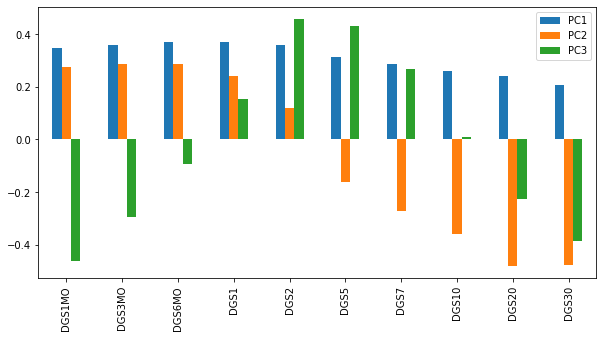

In [204]:
V = pd.DataFrame(pcab_m.pca().components_,index=pcab_m.pc_names(pcab_m.n_features),columns=pcab_m.X.columns)
V.T.iloc[:,0:3].plot(figsize=(10,5),kind='bar')
pcab_m.cps()

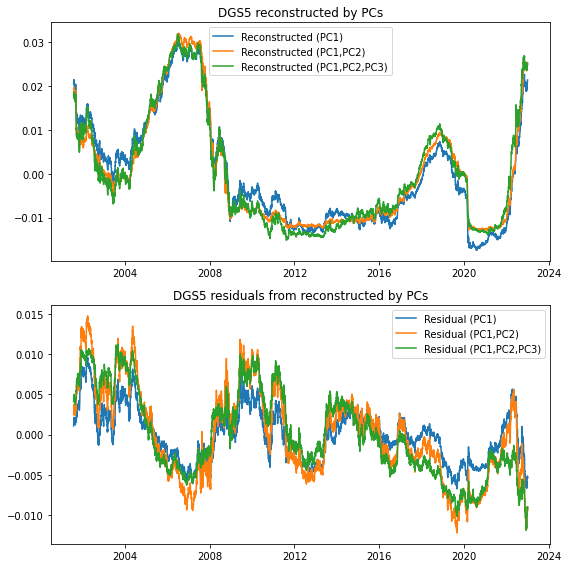

In [205]:
r = 'DGS5'
fig,(ax,ax2)=plt.subplots(figsize=(8,4*2),ncols=1,nrows=2)
ax.plot(pcab_m.x_projected(1)[r])
ax.plot(pcab_m.x_projected(2)[r])
ax.plot(pcab_m.x_projected(3)[r])
ax.legend(['Reconstructed (PC1)','Reconstructed (PC1,PC2)','Reconstructed (PC1,PC2,PC3)'])
ax.set_title('{} reconstructed by PCs'.format(r))

ax2.plot(pcab_m.residuals(1)[r])
ax2.plot(pcab_m.residuals(2)[r])
ax2.plot(pcab_m.residuals(3)[r])
ax2.legend(['Residual (PC1)','Residual (PC1,PC2)','Residual (PC1,PC2,PC3)'])
ax2.set_title('{} residuals from reconstructed by PCs'.format(r))
fig.tight_layout()

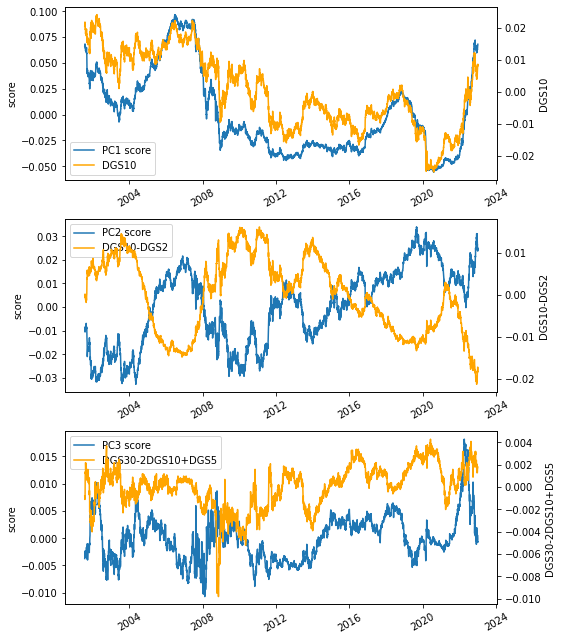

In [206]:
# PC Scores
fig,(ax1,ax2,ax3)=plt.subplots(nrows=3,ncols=1,figsize=(8,3*3))
l1=ax1.plot(pcab_m.scores()['PC1'])
ax12 = ax1.twinx()
l2=ax12.plot(pcab_m.X['DGS10'],color='orange')
ax1.tick_params('x',rotation=30)
ax1.legend(l1+l2,['PC1 score','DGS10'])
ax1.set_ylabel('score')
ax12.set_ylabel('DGS10')
# 
l1=ax2.plot(pcab_m.scores()['PC2'])
ax22 = ax2.twinx()
l2=ax22.plot(pcab_m.X['DGS10']-pcab_m.X['DGS2'],color='orange')
ax2.tick_params('x',rotation=30)
ax2.legend(l1+l2,['PC2 score','DGS10-DGS2'],loc='best')
ax2.set_ylabel('score')
ax22.set_ylabel('DGS10-DGS2')

# 
l1=ax3.plot(pcab_m.scores()['PC3'])
ax32 = ax3.twinx()
l2=ax32.plot(pcab_m.X['DGS30']-2*pcab_m.X['DGS10']+pcab_m.X['DGS5'],color='orange')
ax3.tick_params('x',rotation=30)
ax3.legend(l1+l2,['PC3 score','DGS30-2DGS10+DGS5'],loc='best')
ax3.set_ylabel('score')
ax32.set_ylabel('DGS30-2DGS10+DGS5')
fig.tight_layout()

Text(0.5, 1.0, 'Evolution of PCA Factors 1,2,3')

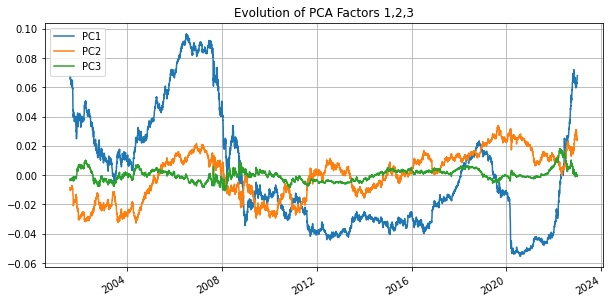

In [207]:
# PC
fig,ax=plt.subplots(figsize=(10,5))
l1=pcab_m.scores().iloc[:,0:3].plot(ax=ax)
ax.grid(True)
ax.set_title('Evolution of PCA Factors 1,2,3')

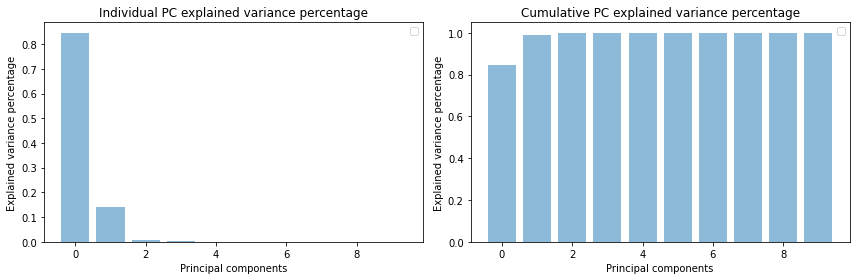

In [208]:
fig,(ax,ax2) = plt.subplots(figsize=(6*2, 4),ncols=2,nrows=1)
ax.bar(range(pcab_m.n_features), pcab_m.cumsum_expvar_ratio()[0], alpha=0.5, align='center')
ax2.bar(range(pcab_m.n_features), pcab_m.cumsum_expvar_ratio()[1], alpha=0.5, align='center')
ax.set_ylabel('Explained variance percentage')
ax.set_xlabel('Principal components')
ax.set_title('Individual PC explained variance percentage')
ax.legend(loc='best')
ax2.set_ylabel('Explained variance percentage')
ax2.set_xlabel('Principal components')
ax2.set_title('Cumulative PC explained variance percentage')
ax2.legend(loc='best')
fig.tight_layout()

### Reconstructing Spread Dataset

In [209]:
pcab_r = PCABase(spread_df)

,PC1,PC2,PC3,PC4,PC5,PC6
SPREAD1y,0.310448,-0.654613,-0.628112,0.022200,0.174088,0.223112
SPREAD2y,0.358660,-0.335847,0.154607,-0.272670,-0.412883,-0.699889
SPREAD3y,0.414415,-0.180298,0.567868,-0.306685,-0.106361,0.606556
SPREAD5y,0.440835,0.044375,0.288345,0.283312,0.748276,-0.283494
SPREAD7y,0.454005,0.230032,-0.083158,0.704910,-0.474572,0.109240
SPREAD10y,0.450321,0.609341,-0.411143,-0.503924,0.052647,0.012814


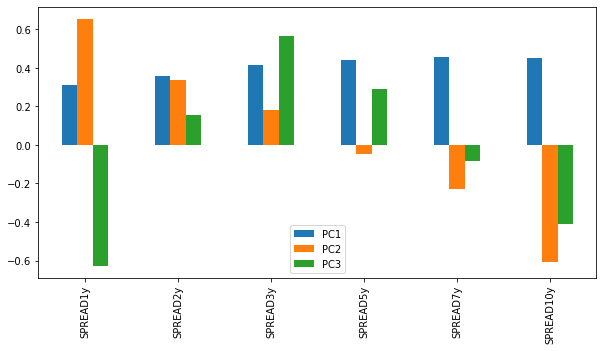

In [210]:
V = pd.DataFrame(pcab_r.pca().components_,index=pcab_r.pc_names(pcab_r.n_features),columns=pcab_r.X.columns)
V.T.iloc[:,0:3].plot(figsize=(10,5),kind='bar')
pcab_r.cps()

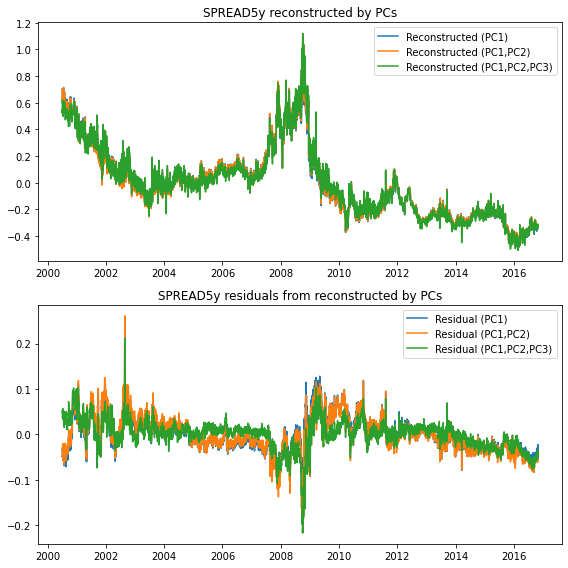

In [211]:
r = 'SPREAD5y'
fig,(ax,ax2)=plt.subplots(figsize=(8,4*2),ncols=1,nrows=2)
ax.plot(pcab_r.x_projected(1)[r])
ax.plot(pcab_r.x_projected(2)[r])
ax.plot(pcab_r.x_projected(3)[r])
ax.legend(['Reconstructed (PC1)','Reconstructed (PC1,PC2)','Reconstructed (PC1,PC2,PC3)'])
ax.set_title('{} reconstructed by PCs'.format(r))

ax2.plot(pcab_r.residuals(1)[r])
ax2.plot(pcab_r.residuals(2)[r])
ax2.plot(pcab_r.residuals(3)[r])
ax2.legend(['Residual (PC1)','Residual (PC1,PC2)','Residual (PC1,PC2,PC3)'])
ax2.set_title('{} residuals from reconstructed by PCs'.format(r))
fig.tight_layout()

Text(0.5, 1.0, 'Evolution of PCA Factors 1,2,3')

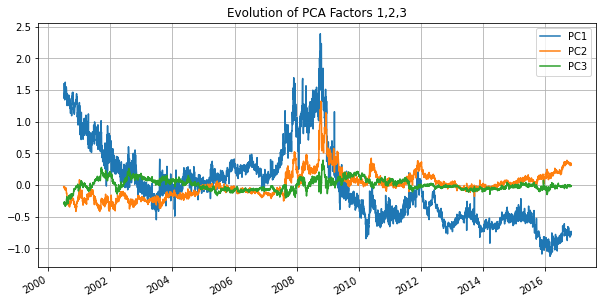

In [212]:
# PC
fig,ax=plt.subplots(figsize=(10,5))
l1=pcab_r.scores().iloc[:,0:3].plot(ax=ax)
ax.grid(True)
ax.set_title('Evolution of PCA Factors 1,2,3')

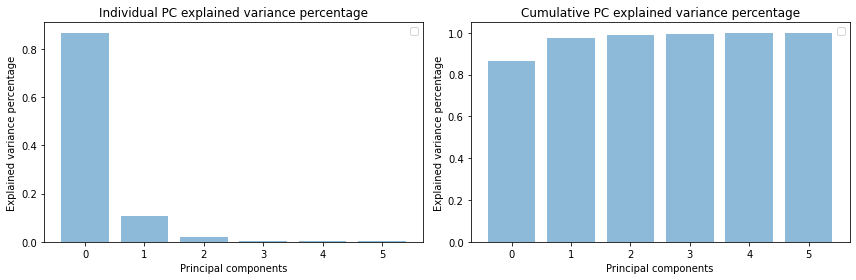

In [213]:
fig,(ax,ax2) = plt.subplots(figsize=(6*2, 4),ncols=2,nrows=1)
ax.bar(range(pcab_r.n_features), pcab_r.cumsum_expvar_ratio()[0], alpha=0.5, align='center')
ax2.bar(range(pcab_r.n_features), pcab_r.cumsum_expvar_ratio()[1], alpha=0.5, align='center')
ax.set_ylabel('Explained variance percentage')
ax.set_xlabel('Principal components')
ax.set_title('Individual PC explained variance percentage')
ax.legend(loc='best')
ax2.set_ylabel('Explained variance percentage')
ax2.set_xlabel('Principal components')
ax2.set_title('Cumulative PC explained variance percentage')
ax2.legend(loc='best')
fig.tight_layout()

## Step 9 - Applying Clustering

### Clustering Function

In [214]:
from sklearn.cluster import KMeans
def model_kmeans(data,n_clusters=3,init_method = 'k-means++',n_init=10):
  model = KMeans(n_clusters=n_clusters,
                  init=init_method,
                  n_init=n_init)
  model.fit(data)
  cluster_labels = model.predict(data)
  cluster_centers = model.cluster_centers_
  fit_res = {'cluster_method':'kmeans',
              'model':model,
              'cluster_labels':cluster_labels,
              'cluster_centers':cluster_centers,
              'data':data}
  return fit_res

### To Swap Data

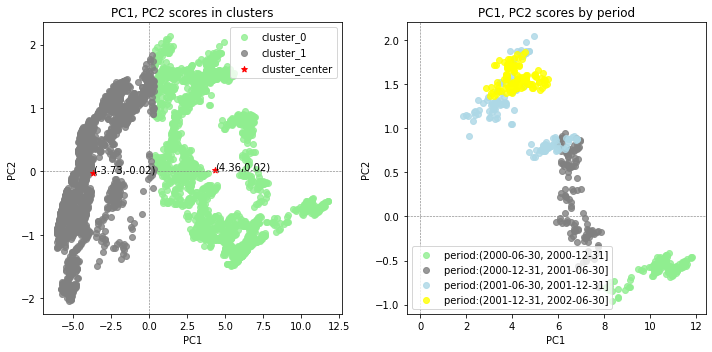

In [215]:
s_w = pcab_w.scores()[['PC1','PC2']]
kmeans = model_kmeans(s_w,n_clusters=2)  
X = s_w.reset_index()
X = X.rename(columns={'DATE':'date'})

feature_pair = ['PC1','PC2']
fig,(ax,ax2)=plt.subplots(ncols=2,nrows=1,figsize=(10,5))
cluster_labels = kmeans['cluster_labels']
X['cluster_label'] = cluster_labels
cluster_centers = kmeans['cluster_centers']
mode_fitted = kmeans['model']
label_order = sorted(list(set(cluster_labels)))
colors = ['lightgreen','grey','lightblue','yellow']
# colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, [1,2,5,10])]
color_map_clusters = dict(zip(label_order, colors))
for (c_label,color) in color_map_clusters.items():
  x = X[X['cluster_label']==c_label][feature_pair[0]]
  y = X[X['cluster_label']==c_label][feature_pair[1]]
  ax.scatter(x,y,c=color,alpha=0.8)
ax.legend()
ax.scatter(cluster_centers[:,0],cluster_centers[:,1],c='red',marker='*')
# add cluster center annotion
for xy in tuple(np.round(cluster_centers,2)):
  ax.annotate("({},{})".format(xy[0],xy[1]),xy=(xy[0],xy[1]))
ax.set_xlabel(feature_pair[0])
ax.set_ylabel(feature_pair[1])
ax.legend(['cluster_{}'.format(c) for c in set(cluster_labels)]+['cluster_center'])
ax.set_title('PC1, PC2 scores in clusters')
ax.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax.axvline(x=0,ls='--',color='grey',linewidth=0.6)
# 
X['date'] = pd.to_datetime(X['date'])
periods = pd.date_range(X['date'].iloc[0]-pd.Timedelta(days=3),X['date'].iloc[-1],freq='6M')
X['date_bucket'] = pd.cut(X['date'],bins=periods)
color_map_periods = dict(zip(X['date_bucket'].unique(), colors))
for (p_label,color) in color_map_periods.items():
  x = X[X['date_bucket']==p_label][feature_pair[0]]
  y = X[X['date_bucket']==p_label][feature_pair[1]]
  ax2.scatter(x,y,c=color,alpha=0.8)
ax2.legend()

ax2.set_xlabel(feature_pair[0])
ax2.set_ylabel(feature_pair[1])
ax2.set_title('PC1, PC2 scores by period')
ax2.legend(['period:{}'.format(c) for c in X['date_bucket'].unique()])
ax2.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax2.axvline(x=0,ls='--',color='grey',linewidth=0.6)
fig.tight_layout()

### To Treasury data

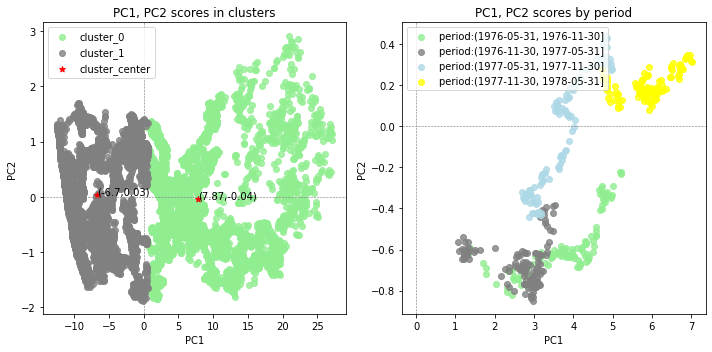

In [216]:
s_t = pcab_t.scores()[['PC1','PC2']]
kmeans = model_kmeans(s_t,n_clusters=2)  
X = s_t.reset_index()
X = X.rename(columns={'Date':'date'})

feature_pair = ['PC1','PC2']
fig,(ax,ax2)=plt.subplots(ncols=2,nrows=1,figsize=(10,5))
cluster_labels = kmeans['cluster_labels']
X['cluster_label'] = cluster_labels
cluster_centers = kmeans['cluster_centers']
mode_fitted = kmeans['model']
label_order = sorted(list(set(cluster_labels)))
colors = ['lightgreen','grey','lightblue','yellow']
color_map_clusters = dict(zip(label_order, colors))
for (c_label,color) in color_map_clusters.items():
  x = X[X['cluster_label']==c_label][feature_pair[0]]
  y = X[X['cluster_label']==c_label][feature_pair[1]]
  ax.scatter(x,y,c=color,alpha=0.8)
ax.legend()
ax.scatter(cluster_centers[:,0],cluster_centers[:,1],c='red',marker='*')
# add cluster center annotion
for xy in tuple(np.round(cluster_centers,2)):
  ax.annotate("({},{})".format(xy[0],xy[1]),xy=(xy[0],xy[1]))
ax.set_xlabel(feature_pair[0])
ax.set_ylabel(feature_pair[1])
ax.legend(['cluster_{}'.format(c) for c in set(cluster_labels)]+['cluster_center'])
ax.set_title('PC1, PC2 scores in clusters')
ax.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax.axvline(x=0,ls='--',color='grey',linewidth=0.6)
# 
X['date'] = pd.to_datetime(X['date'])
periods = pd.date_range(X['date'].iloc[0]-pd.Timedelta(days=3),X['date'].iloc[-1],freq='6M')
X['date_bucket'] = pd.cut(X['date'],bins=periods)
color_map_periods = dict(zip(X['date_bucket'].unique(), colors))
for (p_label,color) in color_map_periods.items():
  x = X[X['date_bucket']==p_label][feature_pair[0]]
  y = X[X['date_bucket']==p_label][feature_pair[1]]
  ax2.scatter(x,y,c=color,alpha=0.8)
ax2.legend()

ax2.set_xlabel(feature_pair[0])
ax2.set_ylabel(feature_pair[1])
ax2.set_title('PC1, PC2 scores by period')
ax2.legend(['period:{}'.format(c) for c in X['date_bucket'].unique()], loc='upper left')
ax2.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax2.axvline(x=0,ls='--',color='grey',linewidth=0.6)
fig.tight_layout()

### To Maturity data

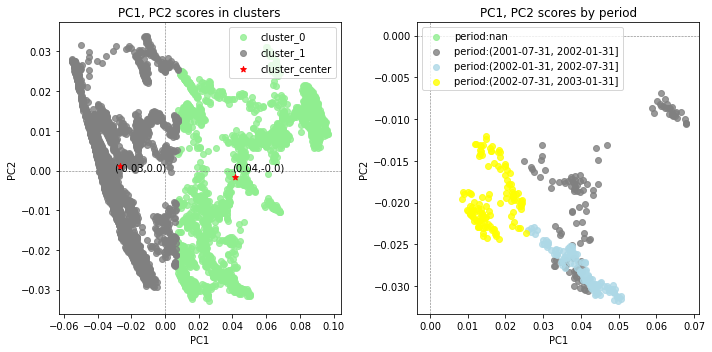

In [217]:
s_m = pcab_m.scores()[['PC1','PC2']]
kmeans = model_kmeans(s_m,n_clusters=2)  
X = s_m.reset_index()
X = X.rename(columns={'index':'date'})

feature_pair = ['PC1','PC2']
fig,(ax,ax2)=plt.subplots(ncols=2,nrows=1,figsize=(10,5))
cluster_labels = kmeans['cluster_labels']
X['cluster_label'] = cluster_labels
cluster_centers = kmeans['cluster_centers']
mode_fitted = kmeans['model']
label_order = sorted(list(set(cluster_labels)))
colors = ['lightgreen','grey','lightblue','yellow']
color_map_clusters = dict(zip(label_order, colors))
for (c_label,color) in color_map_clusters.items():
  x = X[X['cluster_label']==c_label][feature_pair[0]]
  y = X[X['cluster_label']==c_label][feature_pair[1]]
  ax.scatter(x,y,c=color,alpha=0.8)
ax.legend()
ax.scatter(cluster_centers[:,0],cluster_centers[:,1],c='red',marker='*')
# add cluster center annotion
for xy in tuple(np.round(cluster_centers,2)):
  ax.annotate("({},{})".format(xy[0],xy[1]),xy=(xy[0],xy[1]))
ax.set_xlabel(feature_pair[0])
ax.set_ylabel(feature_pair[1])
ax.legend(['cluster_{}'.format(c) for c in set(cluster_labels)]+['cluster_center'])
ax.set_title('PC1, PC2 scores in clusters')
ax.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax.axvline(x=0,ls='--',color='grey',linewidth=0.6)
# 
X['date'] = pd.to_datetime(X['date'])
periods = pd.date_range(X['date'].iloc[0]-pd.Timedelta(days=3),X['date'].iloc[-1],freq='6M')
X['date_bucket'] = pd.cut(X['date'],bins=periods)
color_map_periods = dict(zip(X['date_bucket'].unique(), colors))
for (p_label,color) in color_map_periods.items():
  x = X[X['date_bucket']==p_label][feature_pair[0]]
  y = X[X['date_bucket']==p_label][feature_pair[1]]
  ax2.scatter(x,y,c=color,alpha=0.8)
ax2.legend()

ax2.set_xlabel(feature_pair[0])
ax2.set_ylabel(feature_pair[1])
ax2.set_title('PC1, PC2 scores by period')
ax2.legend(['period:{}'.format(c) for c in X['date_bucket'].unique()], loc='upper left')
ax2.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax2.axvline(x=0,ls='--',color='grey',linewidth=0.6)
fig.tight_layout()

### To Spread data

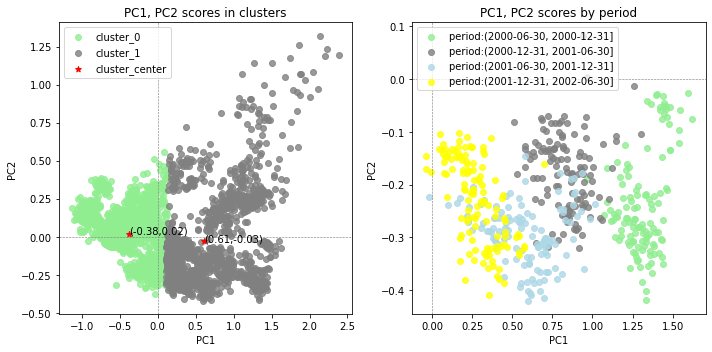

In [218]:
s_r = pcab_r.scores()[['PC1','PC2']]
kmeans = model_kmeans(s_r,n_clusters=2)  
X = s_r.reset_index()
X = X.rename(columns={'index':'date'})

feature_pair = ['PC1','PC2']
fig,(ax,ax2)=plt.subplots(ncols=2,nrows=1,figsize=(10,5))
cluster_labels = kmeans['cluster_labels']
X['cluster_label'] = cluster_labels
cluster_centers = kmeans['cluster_centers']
mode_fitted = kmeans['model']
label_order = sorted(list(set(cluster_labels)))
colors = ['lightgreen','grey','lightblue','yellow']
color_map_clusters = dict(zip(label_order, colors))
for (c_label,color) in color_map_clusters.items():
  x = X[X['cluster_label']==c_label][feature_pair[0]]
  y = X[X['cluster_label']==c_label][feature_pair[1]]
  ax.scatter(x,y,c=color,alpha=0.8)
ax.legend()
ax.scatter(cluster_centers[:,0],cluster_centers[:,1],c='red',marker='*')
# add cluster center annotion
for xy in tuple(np.round(cluster_centers,2)):
  ax.annotate("({},{})".format(xy[0],xy[1]),xy=(xy[0],xy[1]))
ax.set_xlabel(feature_pair[0])
ax.set_ylabel(feature_pair[1])
ax.legend(['cluster_{}'.format(c) for c in set(cluster_labels)]+['cluster_center'])
ax.set_title('PC1, PC2 scores in clusters')
ax.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax.axvline(x=0,ls='--',color='grey',linewidth=0.6)
# 
X['date'] = pd.to_datetime(X['date'])
periods = pd.date_range(X['date'].iloc[0]-pd.Timedelta(days=3),X['date'].iloc[-1],freq='6M')
X['date_bucket'] = pd.cut(X['date'],bins=periods)
color_map_periods = dict(zip(X['date_bucket'].unique(), colors))
for (p_label,color) in color_map_periods.items():
  x = X[X['date_bucket']==p_label][feature_pair[0]]
  y = X[X['date_bucket']==p_label][feature_pair[1]]
  ax2.scatter(x,y,c=color,alpha=0.8)
ax2.legend()

ax2.set_xlabel(feature_pair[0])
ax2.set_ylabel(feature_pair[1])
ax2.set_title('PC1, PC2 scores by period')
ax2.legend(['period:{}'.format(c) for c in X['date_bucket'].unique()], loc='upper left')
ax2.axhline(y=0,ls='--',color='grey',linewidth=0.6)
ax2.axvline(x=0,ls='--',color='grey',linewidth=0.6)
fig.tight_layout()

## Step 10 - Rates Simulation

Interest rates demonstrate the mean reversion property first articulated by Vasicek and later extended by Hull and White. We use the original Vasicek short-rate model to simulate spreads. 

$$ dr_t = κ(θ − r_t)dt + σdW $$

where κ represents the mean reversion strength, θ is the long-run mean and σ  is the volatility.

To calibrate the model to the real world (i.e. we use historical data) we apply the MLE to the sread data. 

Interest rate paths are simulated with the Monte Carlo approach applied to the closed form solution. 

$$r_{t_i} = r_{t_i}{exp}(−κ(t_i−t_{i−1}))+θ(1 − {exp}(−κ(t_i−t_{i−1})))+Z√{{σ^2(1−exp(−2κ(t_i−t_{i−1})))}/{2κ}}$$

where $$Z : N(0,1)$$

### Defining functions

In [219]:
#The closed form solution for the Vasicek Model
def NextRate(r, kappa, theta, sigma, dt=1/252):

    val1 = np.exp(-1*kappa*dt)
    val2 = (sigma**2)*(1-val1**2) / (2*kappa)
    out = r*val1 + theta*(1-val1) + (np.sqrt(val2))*np.random.normal()
    return out

In [220]:
#Rates simulation based on the closed form solution for the Vasicek Model
def Sim(N, r0, kappa, theta, sigma, dt = 1/252):
    short_r = [0]*N
    short_r[0] = r0
    for i in range(1,N):
        short_r[i] = NextRate(short_r[i-1], kappa, theta, sigma, dt)
    
    return short_r

In [221]:
#Simulation for M rate curves
def MultiSim(M, N, r0, kappa, theta, sigma, dt = 1/252):
    sim_arr = np.ndarray((N, M))
    
    for i in range(0,M):
        sim_arr[:, i] = Sim(N, r0, kappa, theta, sigma, dt)
    
    return sim_arr

In [222]:
def Calibration(rates, dt=1/252):
    n = len(rates)
    
    Sx = sum(rates[0:(n-1)])
    Sy = sum(rates[1:n])
    Sxx = np.dot(rates[0:(n-1)], rates[0:(n-1)])
    Sxy = np.dot(rates[0:(n-1)], rates[1:n])
    Syy = np.dot(rates[1:n], rates[1:n])
    
    theta = (Sy * Sxx - Sx * Sxy) / (n * (Sxx - Sxy) - (Sx**2 - Sx*Sy))
    kappa = -np.log((Sxy - theta * Sx - theta * Sy + n * theta**2) / (Sxx - 2*theta*Sx + n*theta**2)) / dt
    a = np.exp(-kappa * dt)
    sigmah2 = (Syy - 2*a*Sxy + a**2 * Sxx - 2*theta*(1-a)*(Sy - a*Sx) + n*theta**2 * (1-a)**2) / n
    sigma = np.sqrt(sigmah2*2*kappa / (1-a**2))
    r0 = rates[n-1]
    
    return [kappa, theta, sigma, r0]

### Model Calibration

In [223]:
swp_cols = ["SWAP1","SWAP2","SWAP3","SWAP5","SWAP7","SWAP10"]
tres_cols = ['TRESY1y','TRESY2y','TRESY3y','TRESY5y','TRESY7y','TRESY10y']
mat_cols = ["DGS1","DGS2","DGS5","DGS7","DGS10"]
spr_cols = ["SPREAD1y", "SPREAD2y", "SPREAD3y", "SPREAD5y", "SPREAD7y", "SPREAD10y"]

#### For Swap Data

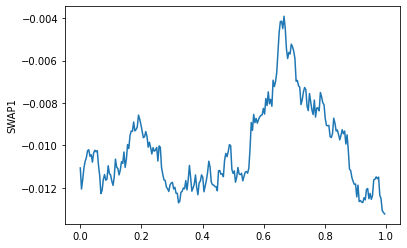

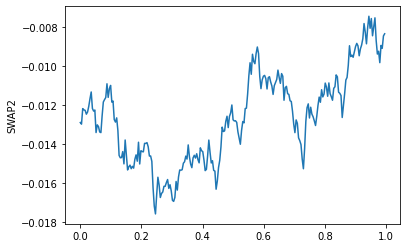

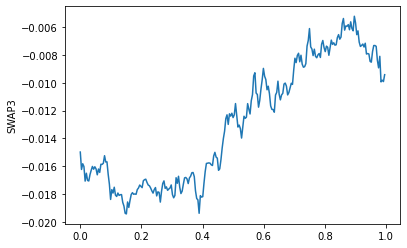

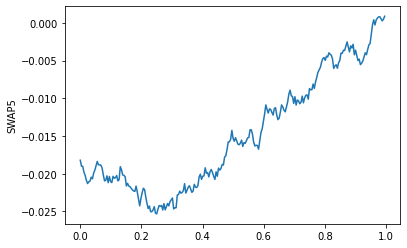

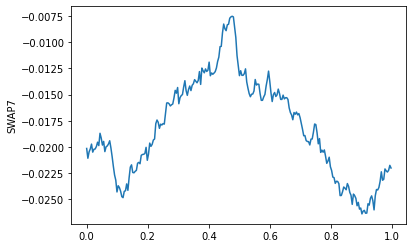

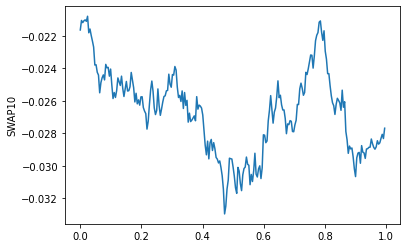

In [224]:
for i in swp_cols:
  params = Calibration(swap_df.loc[:, i].dropna()/100)
  kappa = params[0]
  theta = params[1]
  sigma = params[2]
  r0 = params[3]
  years = 1
  N = years * 252
  t = np.arange(0,N)/252
  test_sim = Sim(N, r0, kappa, theta, sigma, 1/252)
  plt.plot(t,test_sim)
  plt.ylabel(i)
  plt.show()

#### For Treasury Data

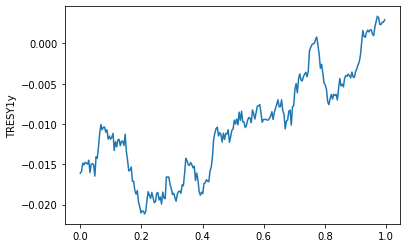

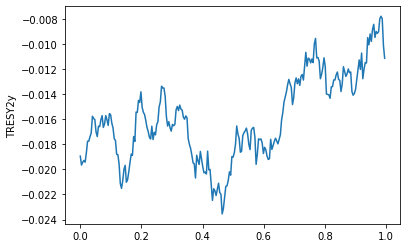

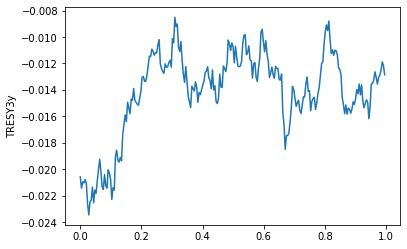

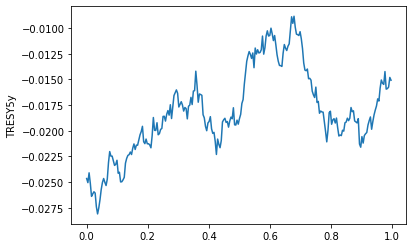

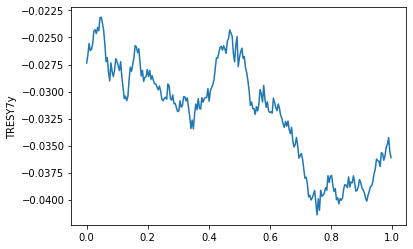

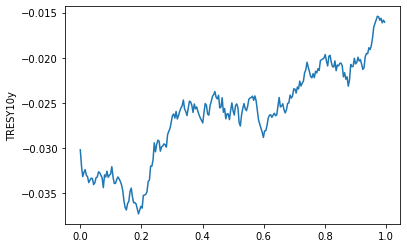

In [225]:
for i in tres_cols:
  params = Calibration(treasury_df2.loc[:, i].dropna()/100)
  kappa = params[0]
  theta = params[1]
  sigma = params[2]
  r0 = params[3]
  years = 1
  N = years * 252
  t = np.arange(0,N)/252
  test_sim = Sim(N, r0, kappa, theta, sigma, 1/252)
  plt.plot(t,test_sim)
  plt.ylabel(i)
  plt.show()

#### For Maturity Data

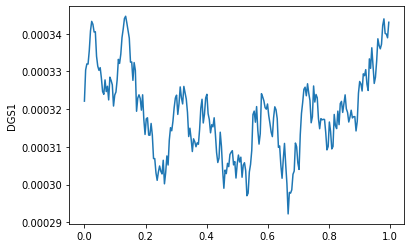

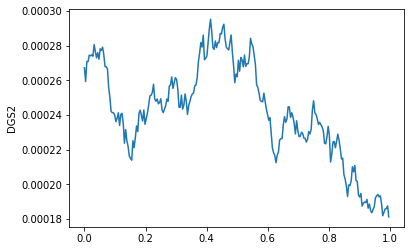

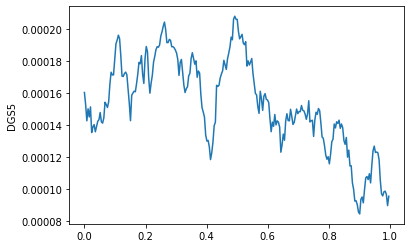

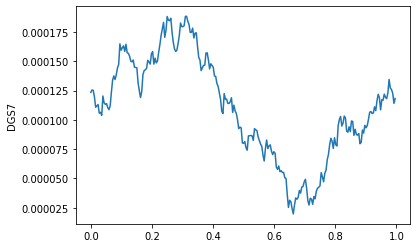

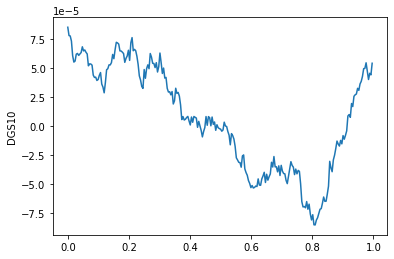

In [226]:
for i in mat_cols:
  params = Calibration(maturity_df.loc[:, i].dropna()/100)
  kappa = params[0]
  theta = params[1]
  sigma = params[2]
  r0 = params[3]
  years = 1
  N = years * 252
  t = np.arange(0,N)/252
  test_sim = Sim(N, r0, kappa, theta, sigma, 1/252)
  plt.plot(t,test_sim)
  plt.ylabel(i)
  plt.show()

#### For Spread Data

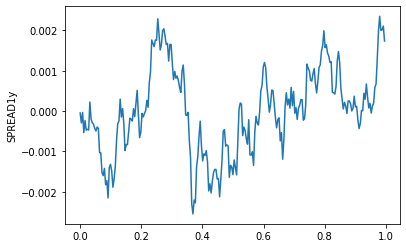

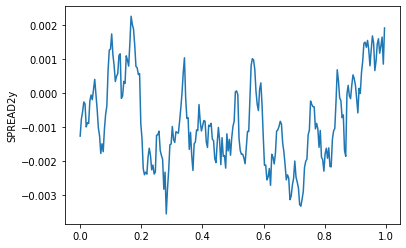

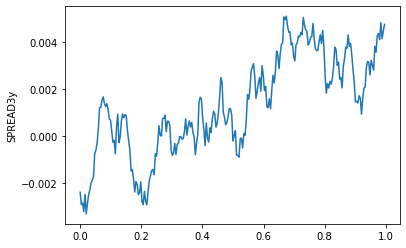

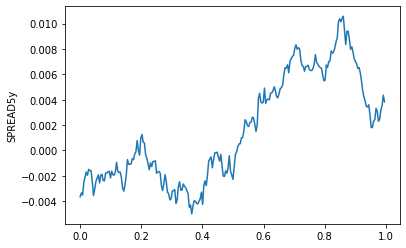

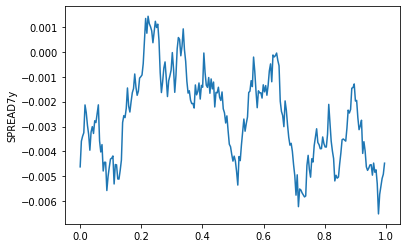

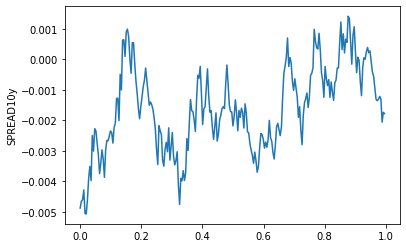

In [227]:
for i in spr_cols:
  params = Calibration(spread_df.loc[:, i].dropna()/100)
  kappa = params[0]
  theta = params[1]
  sigma = params[2]
  r0 = params[3]
  years = 1
  N = years * 252
  t = np.arange(0,N)/252
  test_sim = Sim(N, r0, kappa, theta, sigma, 1/252)
  plt.plot(t,test_sim)
  plt.ylabel(i)
  plt.show()

### Rates Simulation - I

The simulation starts with r0 (initial rate value) equals to last observed rate value.

#### For Swap Data

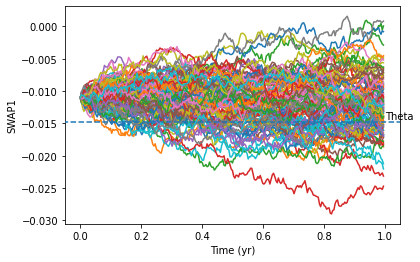

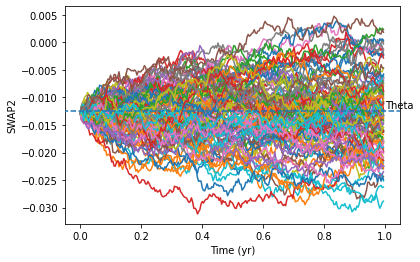

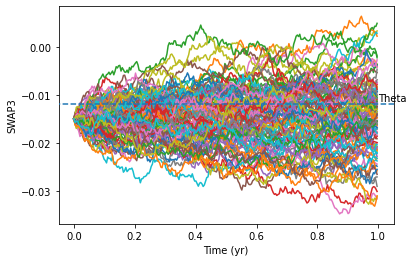

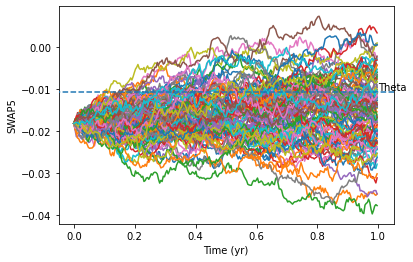

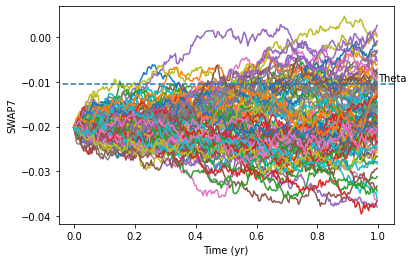

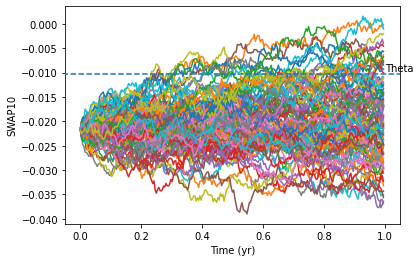

In [228]:
 for i in swp_cols:
   params = Calibration(swap_df.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]
   r0 = params[3]

   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, r0, kappa, theta, sigma)

   plt.plot(t,rates_arr)

   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()

#### For Treasury Data

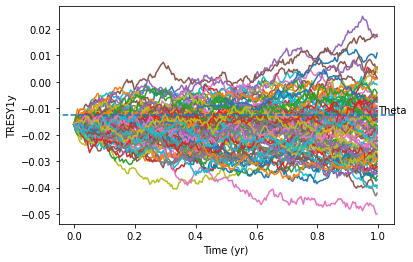

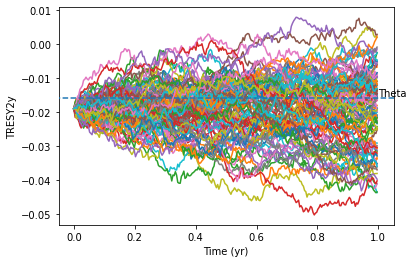

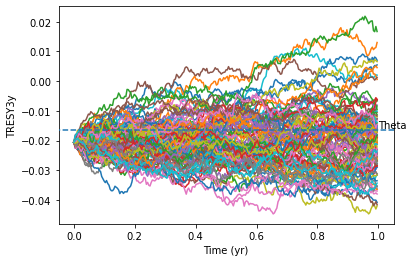

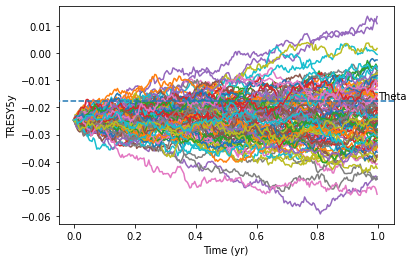

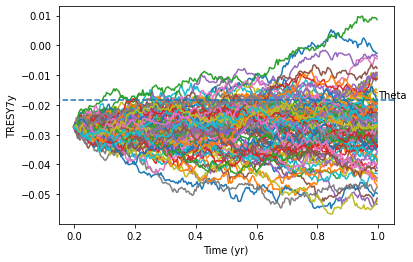

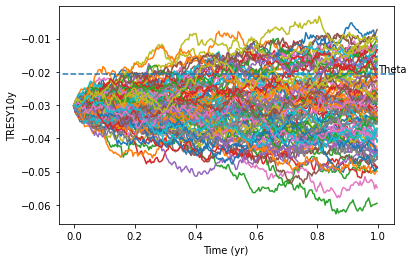

In [229]:
 for i in tres_cols:
   params = Calibration(treasury_df2.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]
   r0 = params[3]

   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, r0, kappa, theta, sigma)

   plt.plot(t,rates_arr)

   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()

#### For Maturity Data

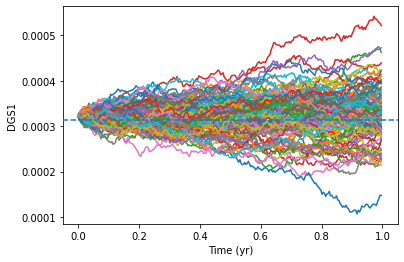

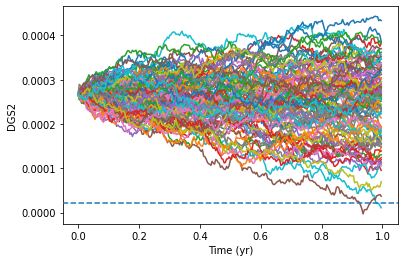

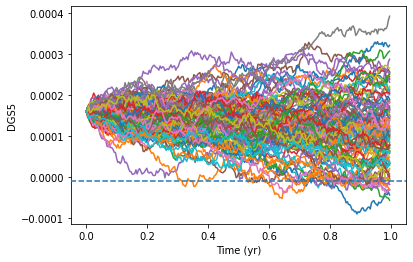

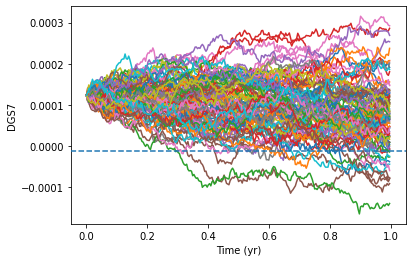

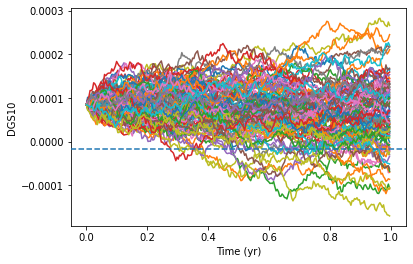

In [230]:
 for i in mat_cols:
   params = Calibration(maturity_df.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]
   r0 = params[3]

   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, r0, kappa, theta, sigma)

   plt.plot(t,rates_arr)

   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()

#### For Spread Data

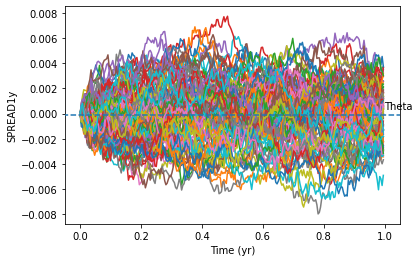

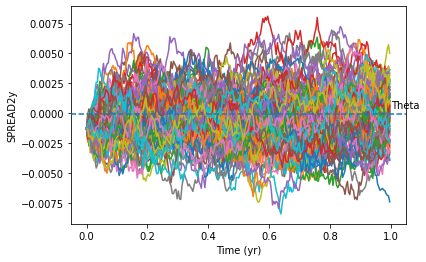

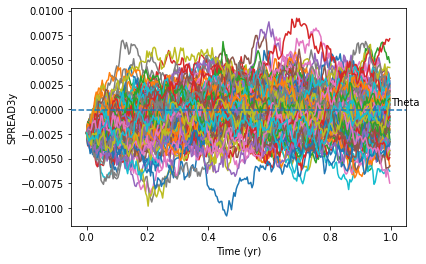

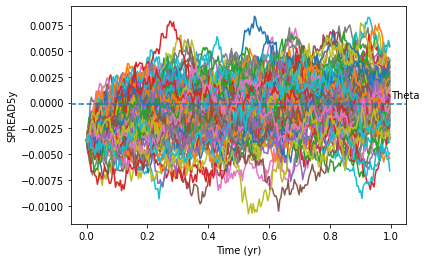

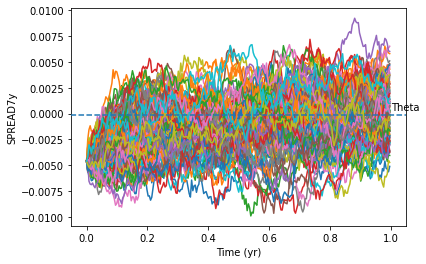

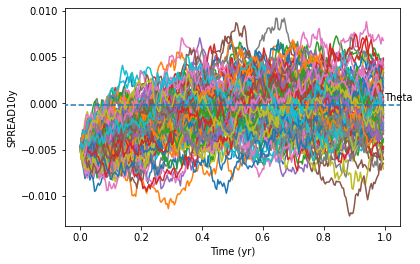

In [231]:
 for i in spr_cols:
   params = Calibration(spread_df.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]
   r0 = params[3]

   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, r0, kappa, theta, sigma)

   plt.plot(t,rates_arr)

   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()

### Rates Simulation - II

The simulation starts with r0 (initial rate value) far away from the last observed value to demonstrate the mean reversion property of interwest rates. 

#### For Swap Data

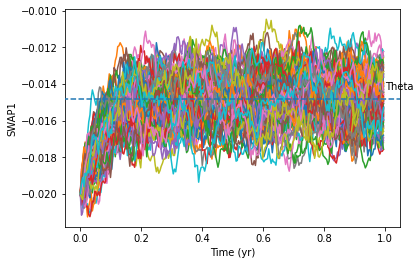

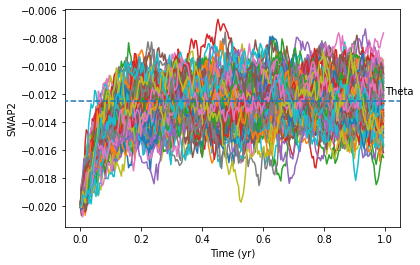

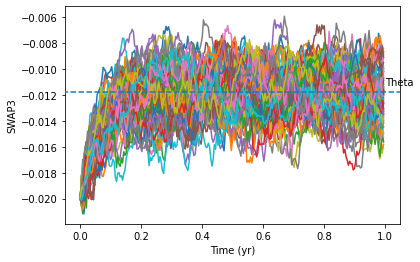

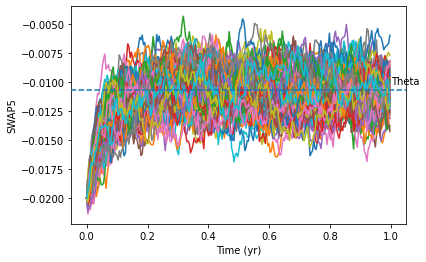

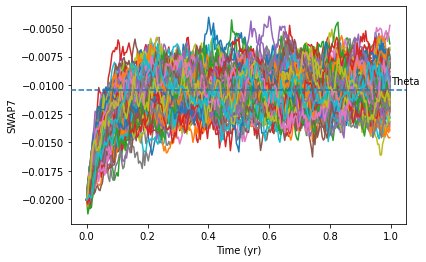

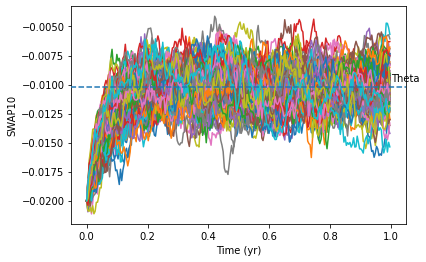

In [232]:
 for i in swp_cols:
   params = Calibration(swap_df.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]


   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, -0.02, kappa*50, theta, sigma)
   plt.plot(t,rates_arr)
   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()

#### For Treasury Data

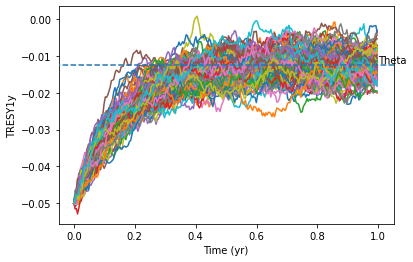

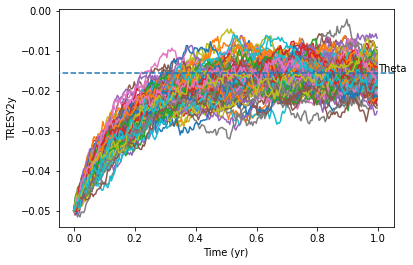

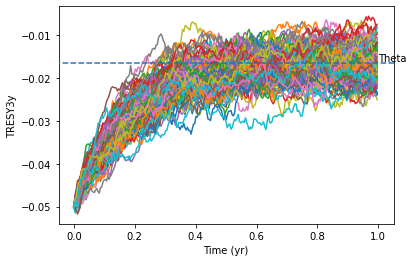

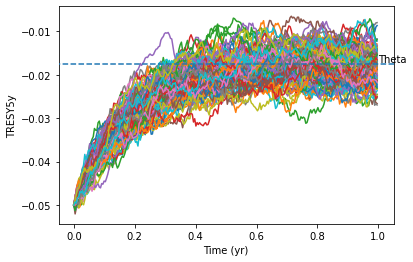

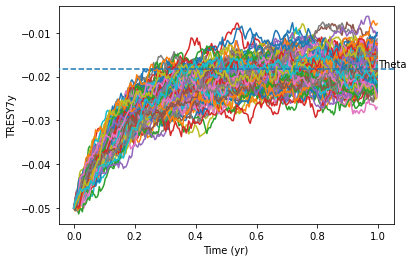

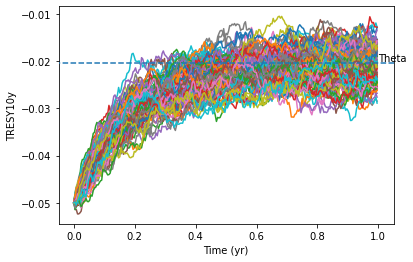

In [233]:
 for i in tres_cols:
   params = Calibration(treasury_df2.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]


   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, -0.05, kappa*100, theta, sigma)
   plt.plot(t,rates_arr)
   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()

#### For Maturity Data

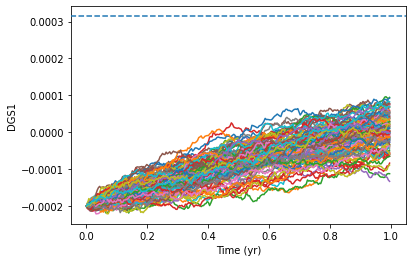

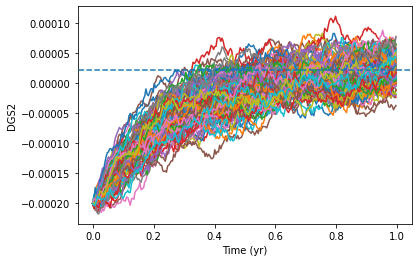

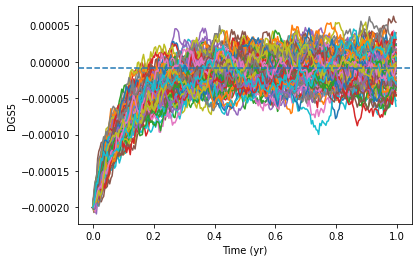

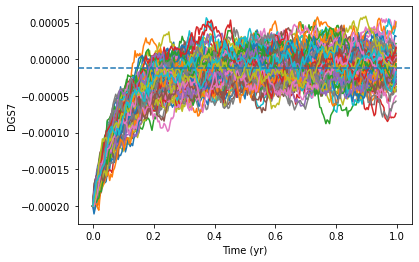

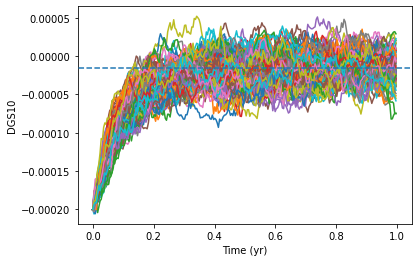

In [234]:
 for i in mat_cols:
   params = Calibration(maturity_df.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]


   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, -0.0002, kappa*30, theta, sigma)
   plt.plot(t,rates_arr)
   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()

#### For Spread Data

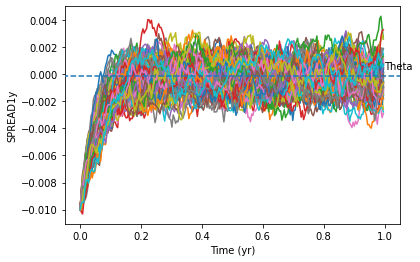

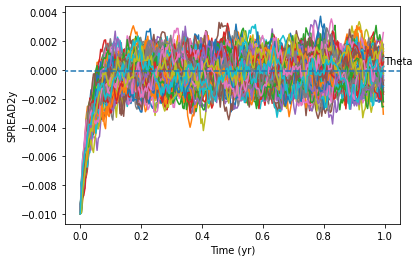

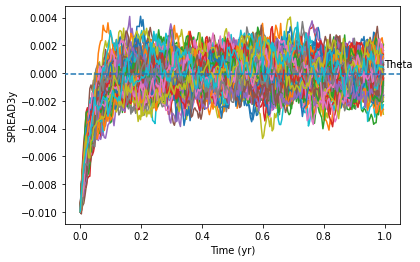

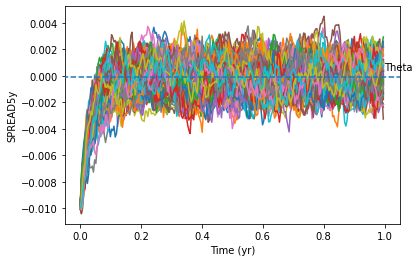

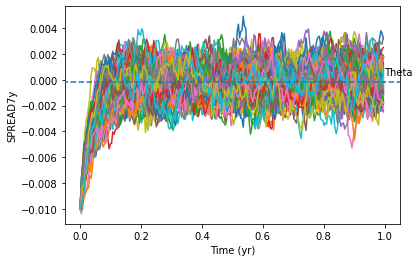

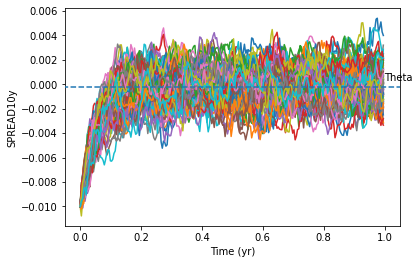

In [235]:
 for i in spr_cols:
   params = Calibration(spread_df.loc[:, i].dropna()/100)
   kappa = params[0]
   theta = params[1]
   sigma = params[2]


   years = 1
   N = years * 252
   t = np.arange(0,N)/252
   M = 100
   rates_arr = MultiSim(M, N, -0.01, kappa*5, theta, sigma)
   plt.plot(t,rates_arr)
   plt.hlines(y=theta, xmin = -100, xmax=100, zorder=10, linestyles = 'dashed', label='Theta')
   plt.annotate('Theta', xy=(1.0, theta+0.0005))
   plt.xlim(-0.05, 1.05)

   plt.ylabel(i)
   plt.xlabel("Time (yr)")
   plt.show()